In [1]:
import pandas as pd
import time

In [2]:
start=time.perf_counter()

In [3]:
from DatabaseCreator import DatabaseCreator
import CJDH_local_settings

#Run Database Creator
if __name__ == "__main__":
    db_creator = DatabaseCreator(db_settings=CJDH_local_settings.local_settings['FPL_Points_Predictor'])
    fpl_engine = db_creator.get_engine_for("fpl_data_analysis")

In [4]:
from FPLPredictor import FPLPredictor

In [5]:
#add this info to a settings dict?
stats_current_gameweek = 14
picks_current_gameweek = 14
current_season = 20252026

In [6]:
# Load df from sql
df = db_creator.run_sql("""SELECT *
                        FROM playergw_transformed
                          """)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146954 entries, 0 to 146953
Columns: 293 entries, player_name_id to saves_elo_adj_per90_running_avg_prev_10
dtypes: float64(288), object(5)
memory usage: 328.5+ MB


In [7]:
df[(df['season']==current_season)
   &(df['team_name']=='Arsenal')
#    &(df['event']==9)
   &(df['player_name_id']=='Bukayo Saka')
   ][['player_name_id','event','total_points','opp_team_name']].sort_values(by='event')

,player_name_id,event,total_points,opp_team_name
131712,Bukayo Saka,1.0,3.0,Man Utd
131871,Bukayo Saka,2.0,6.0,Leeds
131872,Bukayo Saka,3.0,0.0,Liverpool
131873,Bukayo Saka,4.0,0.0,Nott'm Forest
131715,Bukayo Saka,5.0,1.0,Man City
131718,Bukayo Saka,6.0,2.0,Newcastle
131874,Bukayo Saka,7.0,8.0,West Ham
131875,Bukayo Saka,8.0,7.0,Fulham
131877,Bukayo Saka,9.0,3.0,Crystal Palace
131878,Bukayo Saka,10.0,3.0,Burnley


In [8]:
cbi_defcon_cols = ['cbi_alltime_avg',
 'cbi_per90_alltime_avg',
 'cbi_running_avg_prev_3',
 'cbi_per90_running_avg_prev_3',
 'cbi_elo_adj_running_avg_prev_3',
 'cbi_elo_adj_per90_running_avg_prev_3',
 'cbi_running_avg_prev_5',
 'cbi_per90_running_avg_prev_5',
 'cbi_elo_adj_running_avg_prev_5',
 'cbi_elo_adj_per90_running_avg_prev_5',
 'cbi_running_avg_prev_10',
 'cbi_per90_running_avg_prev_10',
 'cbi_elo_adj_running_avg_prev_10',
 'cbi_elo_adj_per90_running_avg_prev_10',
 'defensive_contribution_alltime_avg',
 'defensive_contribution_per90_alltime_avg',
 'defensive_contribution_running_avg_prev_3',
 'defensive_contribution_per90_running_avg_prev_3',
 'defensive_contribution_elo_adj_running_avg_prev_3',
 'defensive_contribution_elo_adj_per90_running_avg_prev_3',
 'defensive_contribution_running_avg_prev_5',
 'defensive_contribution_per90_running_avg_prev_5',
 'defensive_contribution_elo_adj_running_avg_prev_5',
 'defensive_contribution_elo_adj_per90_running_avg_prev_5',
 'defensive_contribution_running_avg_prev_10',
 'defensive_contribution_per90_running_avg_prev_10',
 'defensive_contribution_elo_adj_running_avg_prev_10',
 'defensive_contribution_elo_adj_per90_running_avg_prev_10',
 'saves_alltime_avg',
 'saves_per90_alltime_avg',
 'saves_running_avg_prev_3',
 'saves_per90_running_avg_prev_3',
 'saves_elo_adj_running_avg_prev_3',
 'saves_elo_adj_per90_running_avg_prev_3',
 'saves_running_avg_prev_5',
 'saves_per90_running_avg_prev_5',
 'saves_elo_adj_running_avg_prev_5',
 'saves_elo_adj_per90_running_avg_prev_5',
 'saves_running_avg_prev_10',
 'saves_per90_running_avg_prev_10',
 'saves_elo_adj_running_avg_prev_10',
 'saves_elo_adj_per90_running_avg_prev_10',
 'recoveries_alltime_avg',
 'recoveries_per90_alltime_avg',
 'recoveries_running_avg_prev_3',
 'recoveries_per90_running_avg_prev_3',
 'recoveries_elo_adj_running_avg_prev_3',
 'recoveries_elo_adj_per90_running_avg_prev_3',
 'recoveries_running_avg_prev_5',
 'recoveries_per90_running_avg_prev_5',
 'recoveries_elo_adj_running_avg_prev_5',
 'recoveries_elo_adj_per90_running_avg_prev_5',
 'recoveries_running_avg_prev_10',
 'recoveries_per90_running_avg_prev_10',
 'recoveries_elo_adj_running_avg_prev_10',
 'recoveries_elo_adj_per90_running_avg_prev_10',
 'tackles_alltime_avg',
 'tackles_per90_alltime_avg',
 'tackles_running_avg_prev_3',
 'tackles_per90_running_avg_prev_3',
 'tackles_elo_adj_running_avg_prev_3',
 'tackles_elo_adj_per90_running_avg_prev_3',
 'tackles_running_avg_prev_5',
 'tackles_per90_running_avg_prev_5',
 'tackles_elo_adj_running_avg_prev_5',
 'tackles_elo_adj_per90_running_avg_prev_5',
 'tackles_running_avg_prev_10',
 'tackles_per90_running_avg_prev_10',
 'tackles_elo_adj_running_avg_prev_10',
 'tackles_elo_adj_per90_running_avg_prev_10']

In [9]:
# #restricts to player_name_id who have >0 minutes in that season
# #model struggles to predict higher values, so maybe cut-off points at 10, or try log(points) as a depvar
# for each indepvar: filter outliers & standardize

Cleaned df size: 7526/13826

Training Set Performance:
R² Score: 0.8052
RMSE: 16.0683
MAE: 11.6248

Test Set Performance:
R² Score: 0.5089
RMSE: 26.2937
MAE: 18.9128

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.594838
                          minutes_elo_adj_running_avg_prev_3    0.032353
                    goals_scored_elo_adj_running_avg_prev_10    0.008961
                            opp_team_elo_running_avg_prev_10    0.008533
                                     bps_running_avg_prev_10    0.006387
                             opp_team_elo_running_avg_prev_3    0.006170
                    minutes_elo_adj_per90_running_avg_prev_5    0.006003
                                 minutes_running_avg_prev_10    0.005838
                             opp_team_elo_running_avg_prev_5    0.005790
                                                opp_team_elo    0.005661
          

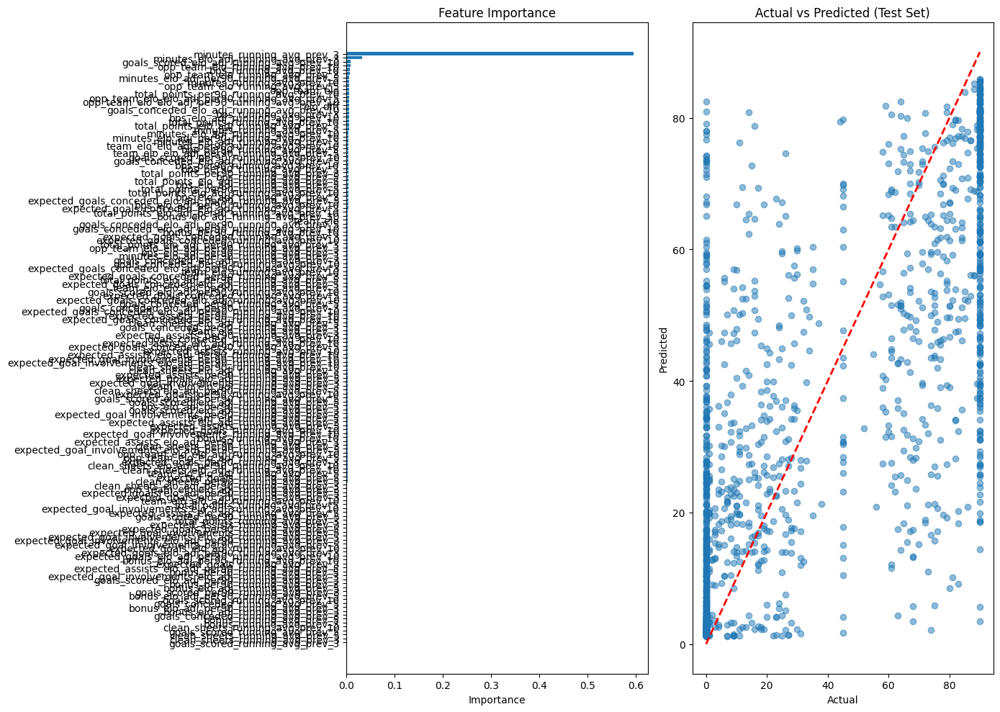

Cleaned df size: 29113/49935

Training Set Performance:
R² Score: 0.6795
RMSE: 21.7376
MAE: 15.9290

Test Set Performance:
R² Score: 0.5202
RMSE: 26.4886
MAE: 19.1274

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.743816
                          minutes_elo_adj_running_avg_prev_3    0.009355
                                 minutes_running_avg_prev_10    0.007635
                                  minutes_running_avg_prev_5    0.007244
                                     bps_running_avg_prev_10    0.006905
                          minutes_elo_adj_running_avg_prev_5    0.005096
                            opp_team_elo_running_avg_prev_10    0.004545
                                                opp_team_elo    0.004343
                                                    elo_diff    0.004150
              opp_team_elo_elo_adj_per90_running_avg_prev_10    0.003727
         

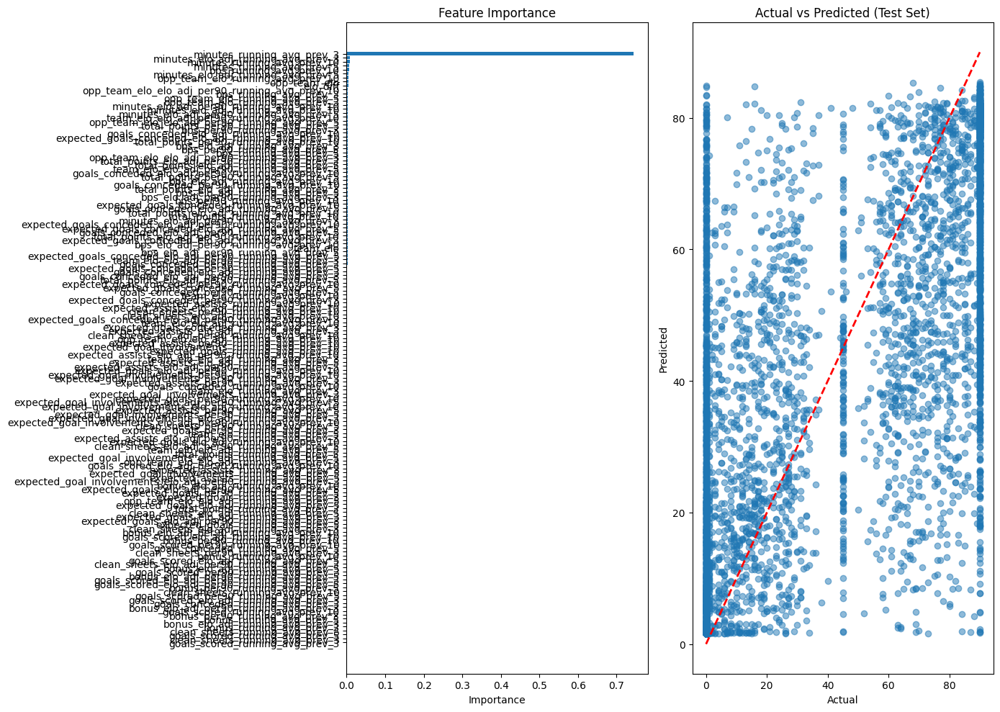

Cleaned df size: 22062/39111

Training Set Performance:
R² Score: 0.6497
RMSE: 24.9795
MAE: 18.4601

Test Set Performance:
R² Score: 0.4731
RMSE: 30.6619
MAE: 22.7214

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.704637
                          minutes_elo_adj_running_avg_prev_3    0.012784
                                 minutes_running_avg_prev_10    0.007483
                            opp_team_elo_running_avg_prev_10    0.007379
                                                opp_team_elo    0.006848
                             opp_team_elo_running_avg_prev_3    0.006293
                                                    elo_diff    0.005655
                             opp_team_elo_running_avg_prev_5    0.005596
                                  minutes_running_avg_prev_5    0.005477
                                     bps_running_avg_prev_10    0.004940
         

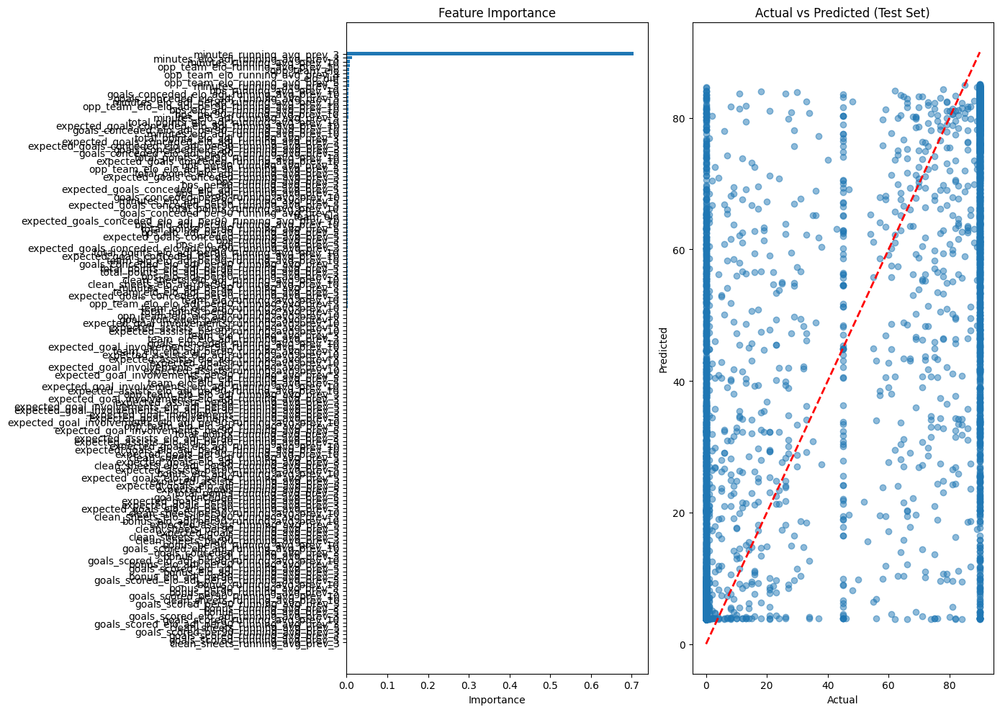

Cleaned df size: 4703/8287

Training Set Performance:
R² Score: 0.8461
RMSE: 17.5559
MAE: 9.7451

Test Set Performance:
R² Score: 0.6497
RMSE: 26.4038
MAE: 15.2683

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.423608
                             total_points_running_avg_prev_3    0.162205
                     total_points_elo_adj_running_avg_prev_3    0.077114
                       total_points_per90_running_avg_prev_3    0.029352
                              bps_elo_adj_running_avg_prev_3    0.018398
                          minutes_elo_adj_running_avg_prev_3    0.017703
                                bps_per90_running_avg_prev_3    0.014374
                            opp_team_elo_running_avg_prev_10    0.010388
                                                opp_team_elo    0.009766
                             opp_team_elo_running_avg_prev_3    0.008516
            

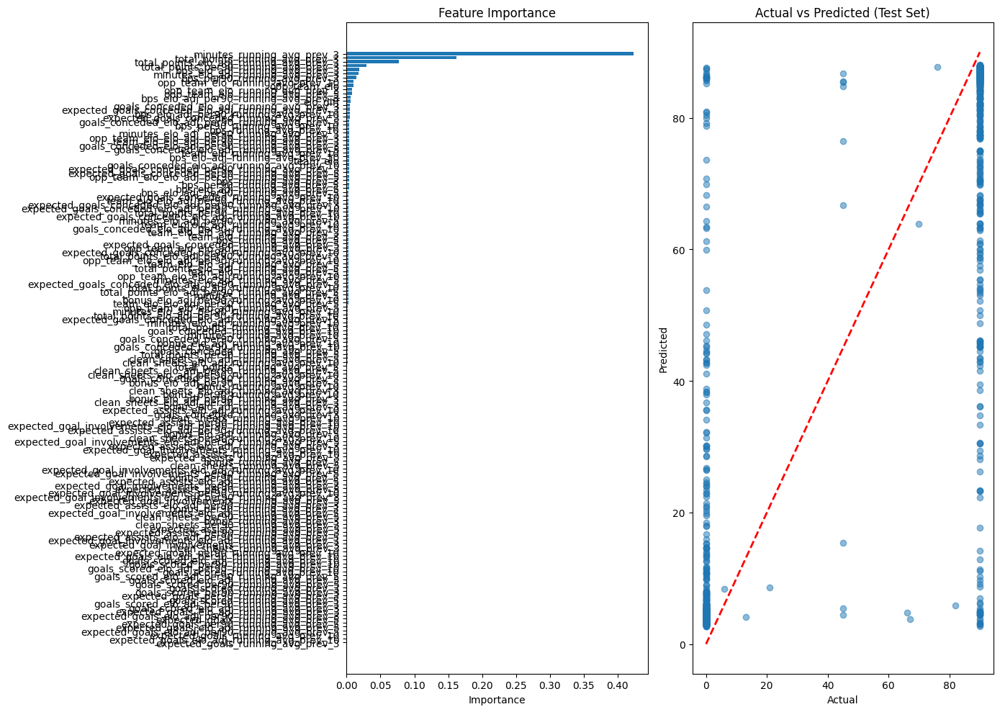

In [10]:
filtered = (df['player_season_minutes_total']>0)#&(df['total_points']<15)#&(df['minutes']>45)

if __name__ == "__main__":
    
    FWD_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols
        )
    FWD_mins_predictor.fit()
    FWD_mins_predictor.plot_results()

    MID_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_mins_predictor.fit()
    MID_mins_predictor.plot_results()

    DEF_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_mins_predictor.fit()
    DEF_mins_predictor.plot_results()

    GK_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_mins_predictor.fit()
    GK_mins_predictor.plot_results()

target=expected_goals_per90, FWD_xG_predictor
Cleaned df size: 2414/4134

Training Set Performance:
R² Score: 0.6196
RMSE: 0.2773
MAE: 0.2109

Test Set Performance:
R² Score: 0.1056
RMSE: 0.4335
MAE: 0.3228

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.058358
expected_goal_involvements_elo_adj_per90_running_avg_prev_10    0.034397
                 expected_goals_conceded_running_avg_prev_10    0.032175
                                                opp_team_elo    0.023230
            expected_goals_elo_adj_per90_running_avg_prev_10    0.023192
                    total_points_elo_adj_running_avg_prev_10    0.017280
                      total_points_per90_running_avg_prev_10    0.016312
              goals_scored_elo_adj_per90_running_avg_prev_10    0.015778
        expected_goal_involvements_per90_running_avg_prev_10    0.014357
           expected_goals_conceded_per90_r

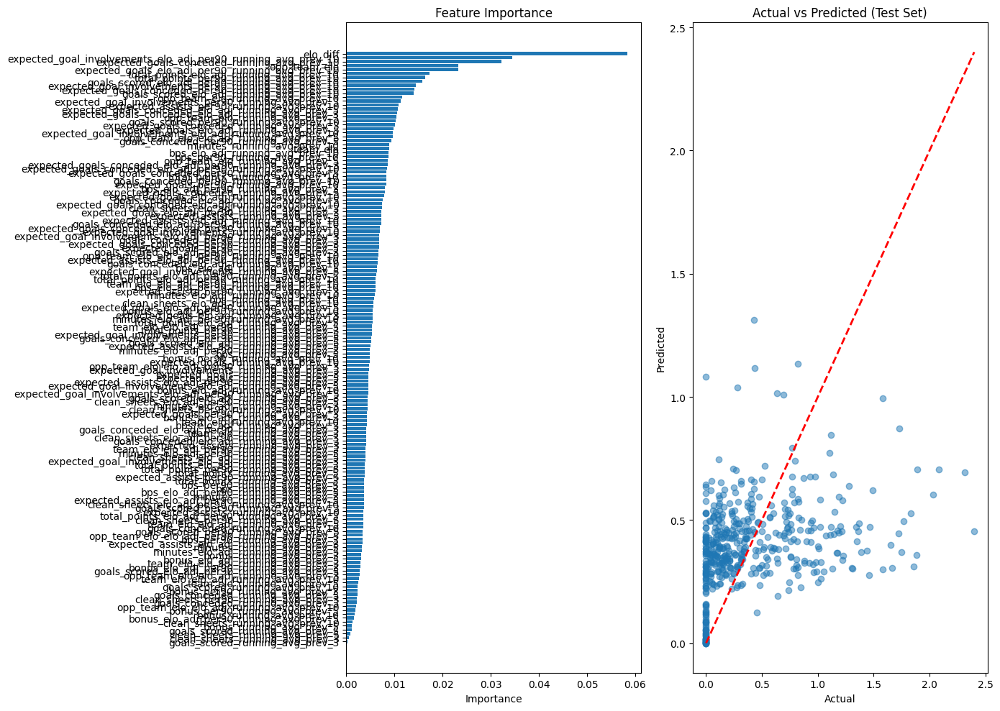

target=expected_goals_per90, MID_xG_predictor
Cleaned df size: 10833/17135

Training Set Performance:
R² Score: 0.5397
RMSE: 0.1720
MAE: 0.1132

Test Set Performance:
R² Score: 0.1374
RMSE: 0.2356
MAE: 0.1431

Feature Importance:
                                                     feature  importance
                          expected_goals_running_avg_prev_10    0.103652
                  expected_goals_elo_adj_running_avg_prev_10    0.066461
                    expected_goals_per90_running_avg_prev_10    0.065004
                                                opp_team_elo    0.038978
            expected_goals_elo_adj_per90_running_avg_prev_10    0.030889
                             opp_team_elo_running_avg_prev_5    0.021779
        expected_goal_involvements_per90_running_avg_prev_10    0.020656
                                                    elo_diff    0.017460
                             opp_team_elo_running_avg_prev_3    0.012987
              expected_goal_involvements

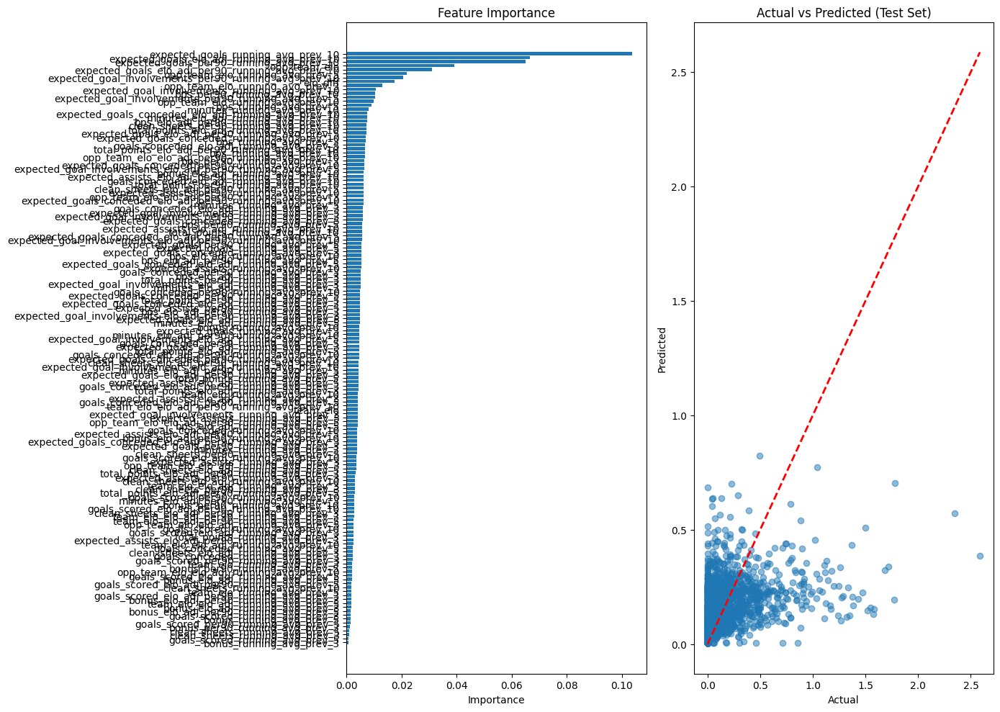

target=expected_goals_per90, DEF_xG_predictor
Cleaned df size: 9321/15120

Training Set Performance:
R² Score: 0.3327
RMSE: 0.0952
MAE: 0.0548

Test Set Performance:
R² Score: 0.0009
RMSE: 0.1158
MAE: 0.0638

Feature Importance:
                                                     feature  importance
            expected_goals_elo_adj_per90_running_avg_prev_10    0.033226
                                                opp_team_elo    0.029920
                             bps_elo_adj_running_avg_prev_10    0.029644
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.027137
                                                    elo_diff    0.024761
                 expected_goals_conceded_running_avg_prev_10    0.023999
                  expected_goals_conceded_running_avg_prev_3    0.023387
                  expected_goals_elo_adj_running_avg_prev_10    0.022793
            expected_goals_conceded_per90_running_avg_prev_3    0.019218
                              bps_elo_adj

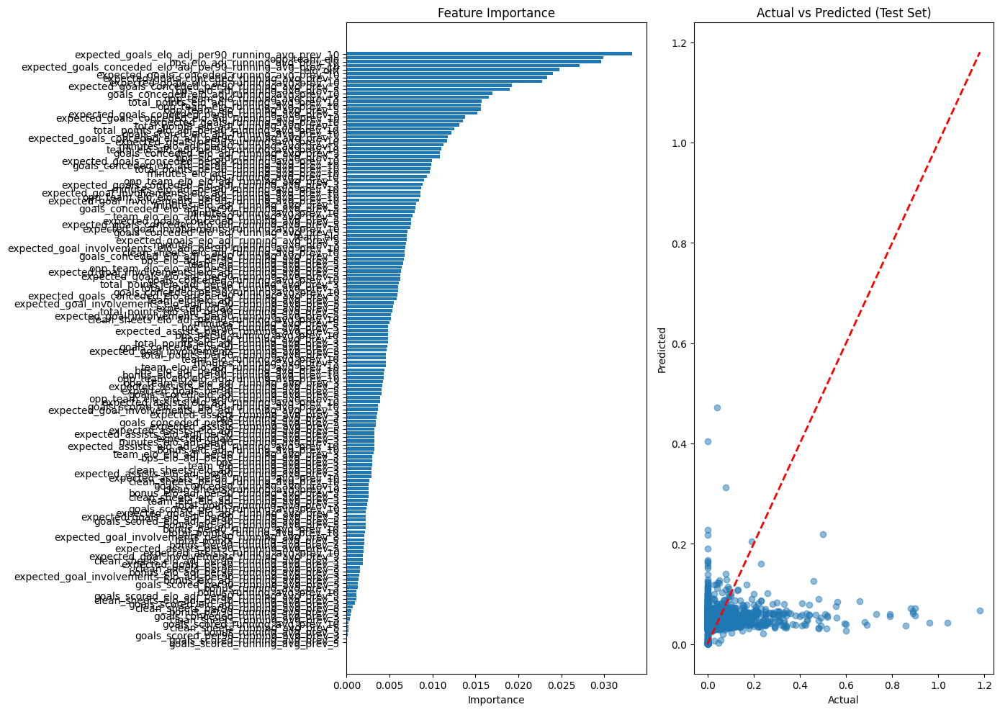

In [11]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_per90, FWD_xG_predictor")
    FWD_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xG_predictor.fit()
    FWD_xG_predictor.plot_results()

    print("target=expected_goals_per90, MID_xG_predictor")
    MID_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xG_predictor.fit()
    MID_xG_predictor.plot_results()
    
    print("target=expected_goals_per90, DEF_xG_predictor")
    DEF_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xG_predictor.fit()
    DEF_xG_predictor.plot_results()

target=expected_assists_per90, FWD_xA_predictor
Cleaned df size: 2414/4134

Training Set Performance:
R² Score: 0.5812
RMSE: 0.0810
MAE: 0.0528

Test Set Performance:
R² Score: 0.0526
RMSE: 0.1165
MAE: 0.0724

Feature Importance:
                                                     feature  importance
                expected_assists_elo_adj_running_avg_prev_10    0.085334
                 expected_assists_elo_adj_running_avg_prev_3    0.050774
          expected_assists_elo_adj_per90_running_avg_prev_10    0.029830
                                                opp_team_elo    0.025553
                 expected_assists_elo_adj_running_avg_prev_5    0.020260
                             opp_team_elo_running_avg_prev_3    0.019135
                                                    elo_diff    0.017410
                       clean_sheets_per90_running_avg_prev_3    0.015266
                   expected_assists_per90_running_avg_prev_5    0.015096
        expected_goal_involvements_per90

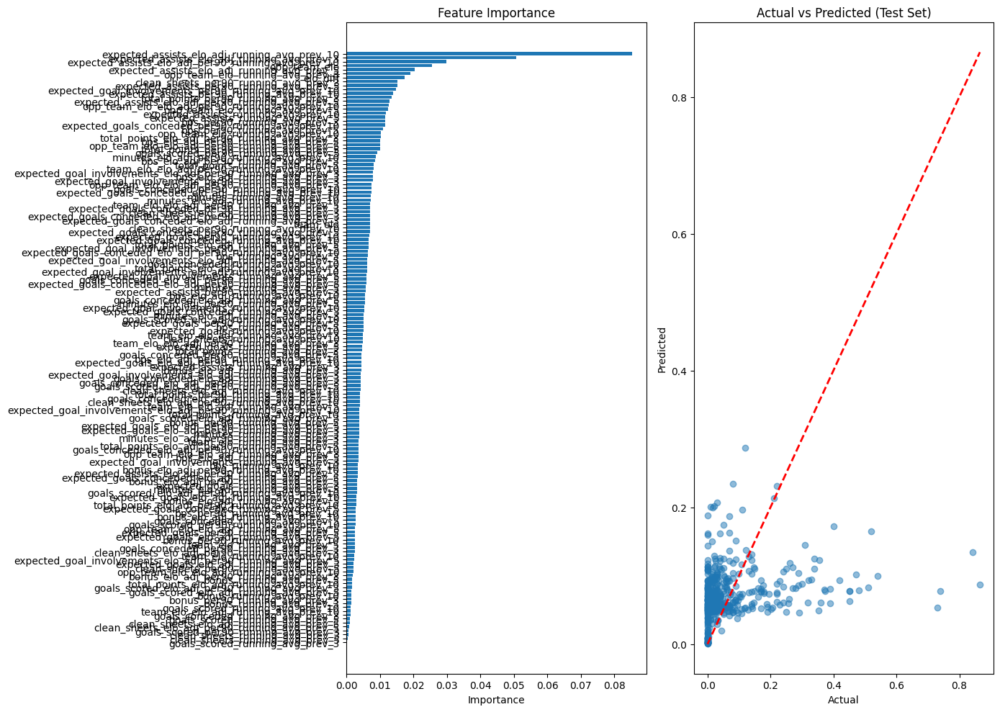

target=expected_assists_per90, MID_xA_predictor
Cleaned df size: 10833/17135

Training Set Performance:
R² Score: 0.4872
RMSE: 0.1180
MAE: 0.0803

Test Set Performance:
R² Score: 0.1397
RMSE: 0.1426
MAE: 0.0950

Feature Importance:
                                                     feature  importance
          expected_assists_elo_adj_per90_running_avg_prev_10    0.107444
                expected_assists_elo_adj_running_avg_prev_10    0.067853
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.051523
                                                    elo_diff    0.038840
                                                opp_team_elo    0.035013
expected_goal_involvements_elo_adj_per90_running_avg_prev_10    0.028467
                        expected_assists_running_avg_prev_10    0.019847
                  expected_assists_per90_running_avg_prev_10    0.016517
                             opp_team_elo_running_avg_prev_5    0.015636
              expected_goal_involvemen

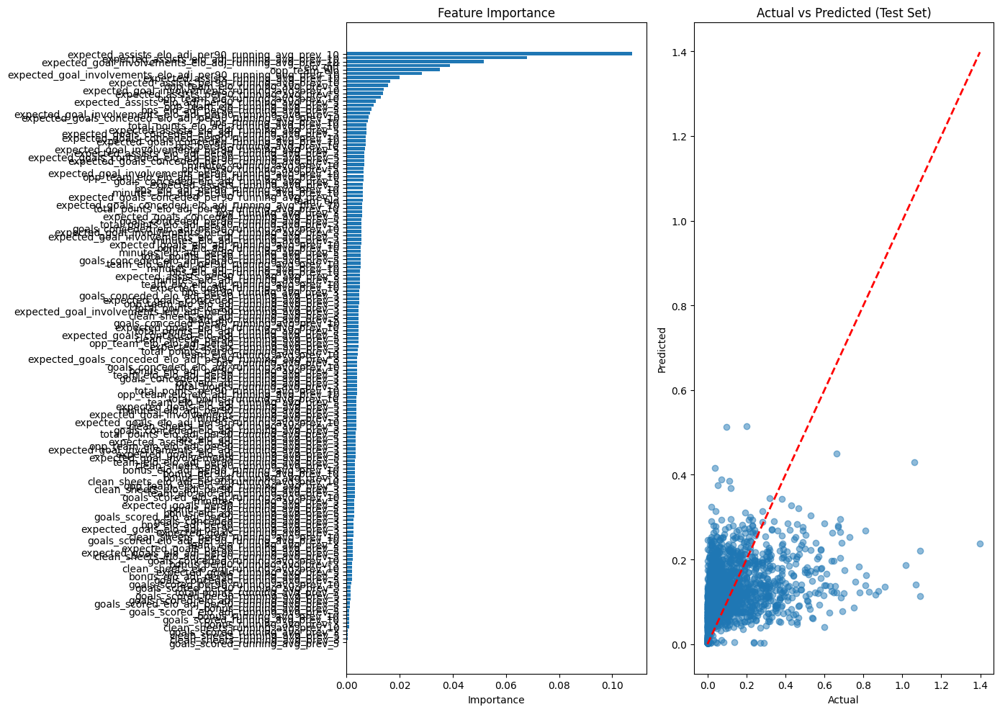

target=expected_assists_per90, DEF_xA_predictor
Cleaned df size: 9321/15120

Training Set Performance:
R² Score: 0.4631
RMSE: 0.0753
MAE: 0.0439

Test Set Performance:
R² Score: 0.0961
RMSE: 0.1016
MAE: 0.0557

Feature Importance:
                                                     feature  importance
          expected_assists_elo_adj_per90_running_avg_prev_10    0.106684
                expected_assists_elo_adj_running_avg_prev_10    0.069075
                  expected_assists_per90_running_avg_prev_10    0.049959
                                                opp_team_elo    0.032684
                 expected_assists_elo_adj_running_avg_prev_5    0.029654
                        expected_assists_running_avg_prev_10    0.026701
                             opp_team_elo_running_avg_prev_3    0.020679
                                                    team_elo    0.016779
                             opp_team_elo_running_avg_prev_5    0.016762
                                       

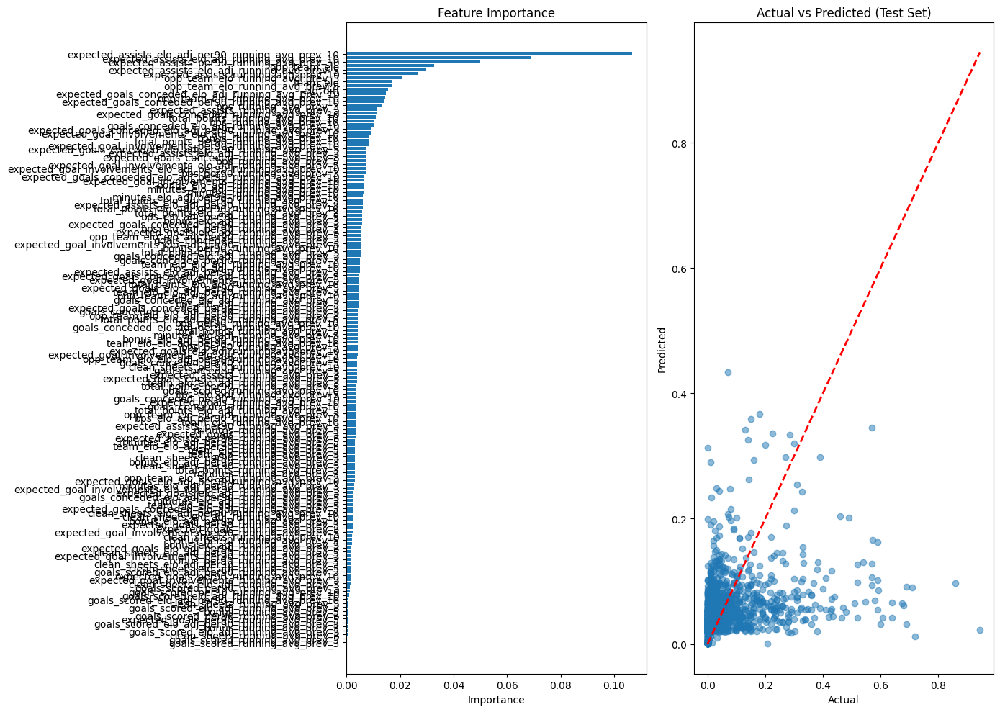

In [12]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_assists_per90, FWD_xA_predictor")
    FWD_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xA_predictor.fit()
    FWD_xA_predictor.plot_results()

    print("target=expected_assists_per90, MID_xA_predictor")
    MID_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xA_predictor.fit()
    MID_xA_predictor.plot_results()
    
    print("target=expected_assists_per90, DEF_xA_predictor")
    DEF_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xA_predictor.fit()
    DEF_xA_predictor.plot_results()

target=expected_goals_conceded_per90, FWD_xGC_predictor
Cleaned df size: 2414/4134

Training Set Performance:
R² Score: 0.7423
RMSE: 0.4778
MAE: 0.3712

Test Set Performance:
R² Score: 0.2781
RMSE: 0.7932
MAE: 0.6106

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.175378
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.099075
           expected_goals_conceded_per90_running_avg_prev_10    0.072952
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.050913
                 expected_goals_conceded_running_avg_prev_10    0.023926
                                                opp_team_elo    0.020469
          expected_goals_conceded_elo_adj_running_avg_prev_5    0.016720
                            opp_team_elo_running_avg_prev_10    0.015855
                             opp_team_elo_running_avg_prev_5    0.014619
                     total_point

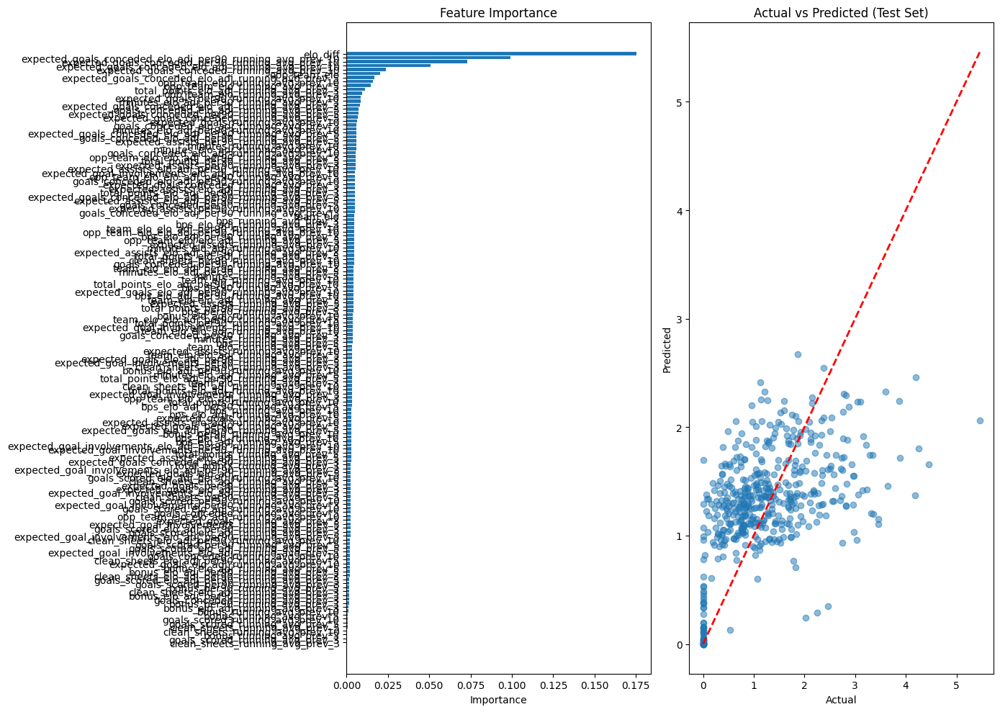

target=expected_goals_conceded_per90, MID_xGC_predictor
Cleaned df size: 10833/17135

Training Set Performance:
R² Score: 0.6303
RMSE: 0.5774
MAE: 0.4384

Test Set Performance:
R² Score: 0.4555
RMSE: 0.6976
MAE: 0.5298

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.252773
           expected_goals_conceded_per90_running_avg_prev_10    0.149856
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.050786
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.050684
                 expected_goals_conceded_running_avg_prev_10    0.040281
                             opp_team_elo_running_avg_prev_3    0.022845
                             opp_team_elo_running_avg_prev_5    0.022329
                                                opp_team_elo    0.019261
                            opp_team_elo_running_avg_prev_10    0.018129
              expected_goal_in

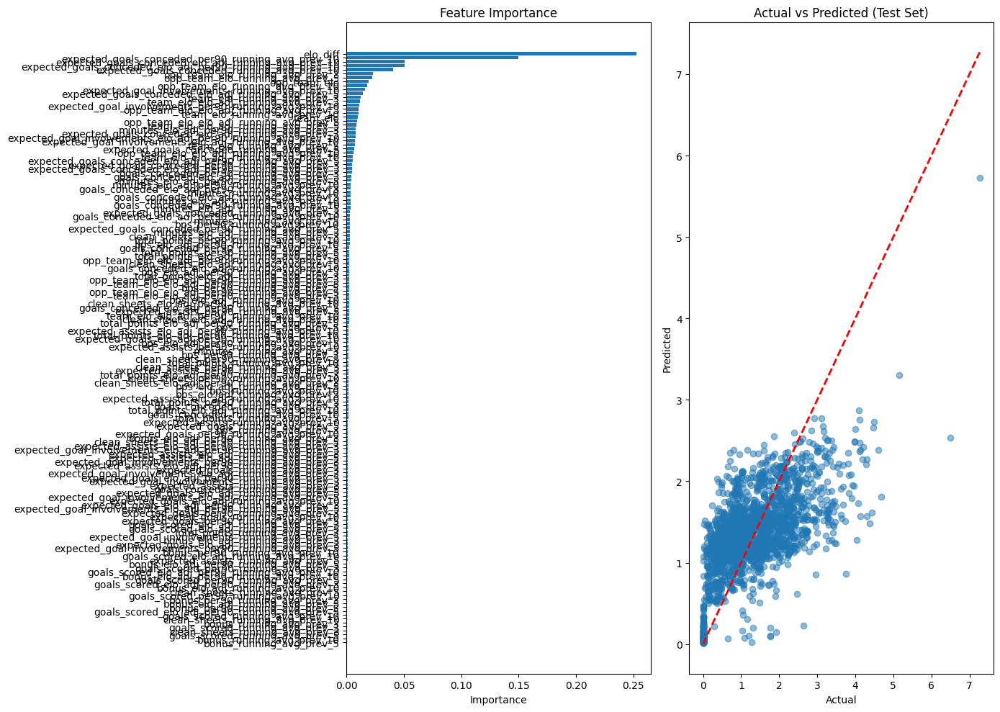

target=expected_goals_conceded_per90, DEF_xGC_predictor
Cleaned df size: 9321/15120

Training Set Performance:
R² Score: 0.6559
RMSE: 0.5603
MAE: 0.4213

Test Set Performance:
R² Score: 0.4686
RMSE: 0.6757
MAE: 0.5142

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.225660
           expected_goals_conceded_per90_running_avg_prev_10    0.182977
                 expected_goals_conceded_running_avg_prev_10    0.065660
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.038167
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.031279
                             opp_team_elo_running_avg_prev_5    0.023888
                                                opp_team_elo    0.022078
                             opp_team_elo_running_avg_prev_3    0.022029
                            opp_team_elo_running_avg_prev_10    0.020987
                         team_e

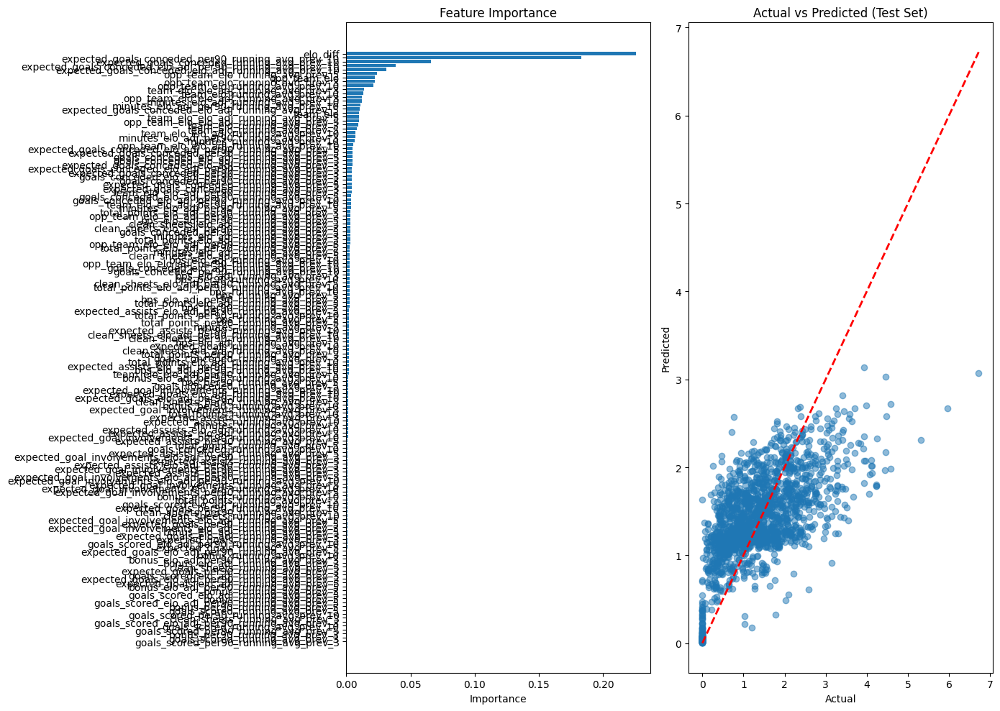

target=expected_goals_conceded_per90, GK_xGC_predictor
Cleaned df size: 2308/3690

Training Set Performance:
R² Score: 0.7193
RMSE: 0.4850
MAE: 0.3730

Test Set Performance:
R² Score: 0.3591
RMSE: 0.7645
MAE: 0.5772

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.202290
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.109348
           expected_goals_conceded_per90_running_avg_prev_10    0.080724
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.055228
                                                opp_team_elo    0.026196
                 expected_goals_conceded_running_avg_prev_10    0.024762
                             opp_team_elo_running_avg_prev_5    0.020165
          expected_goals_conceded_elo_adj_running_avg_prev_5    0.018320
                            opp_team_elo_running_avg_prev_10    0.017592
             goals_conceded_elo_a

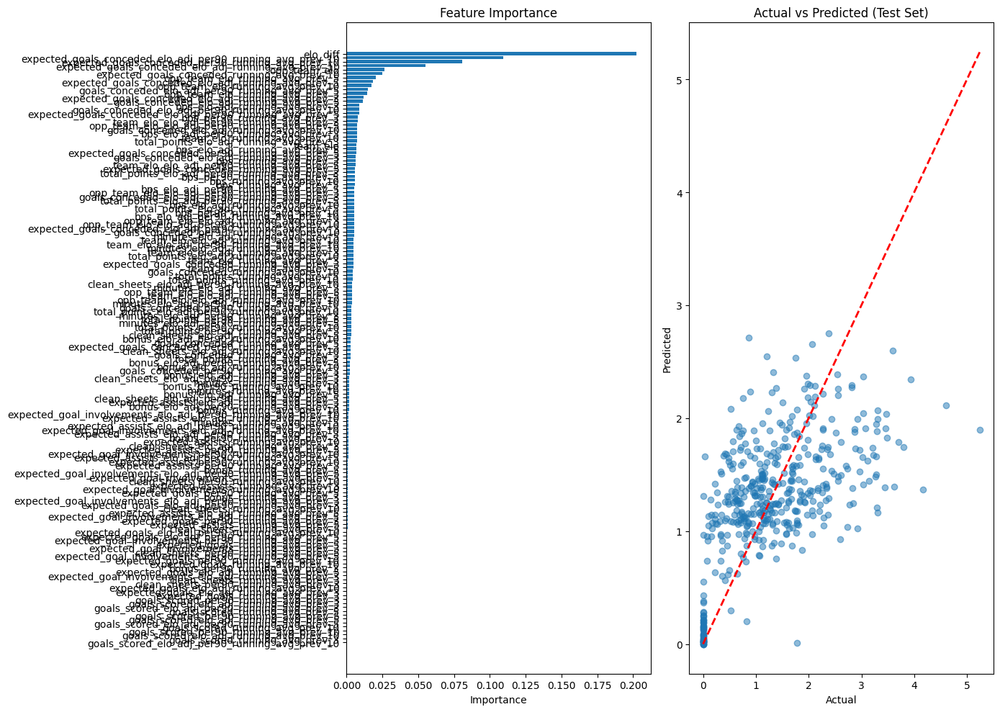

In [13]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_conceded_per90, FWD_xGC_predictor")
    FWD_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xGC_predictor.fit()
    FWD_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, MID_xGC_predictor")
    MID_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xGC_predictor.fit()
    MID_xGC_predictor.plot_results()
    
    print("target=expected_goals_conceded_per90, DEF_xGC_predictor")
    DEF_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xGC_predictor.fit()
    DEF_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, GK_xGC_predictor")
    GK_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_xGC_predictor.fit()
    GK_xGC_predictor.plot_results()

target=bps_per90, FWD_bps_predictor
Cleaned df size: 2414/4134

Training Set Performance:
R² Score: 0.5879
RMSE: 12.2885
MAE: 10.0675

Test Set Performance:
R² Score: 0.0214
RMSE: 19.7933
MAE: 15.5343

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.060234
                            opp_team_elo_running_avg_prev_10    0.025300
                                                opp_team_elo    0.025205
                             opp_team_elo_running_avg_prev_3    0.022658
              clean_sheets_elo_adj_per90_running_avg_prev_10    0.021242
                                     bps_running_avg_prev_10    0.015863
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.011033
                     opp_team_elo_elo_adj_running_avg_prev_3    0.011018
                          goals_conceded_running_avg_prev_10    0.010952
                   goals_conceded_elo_adj_runnin

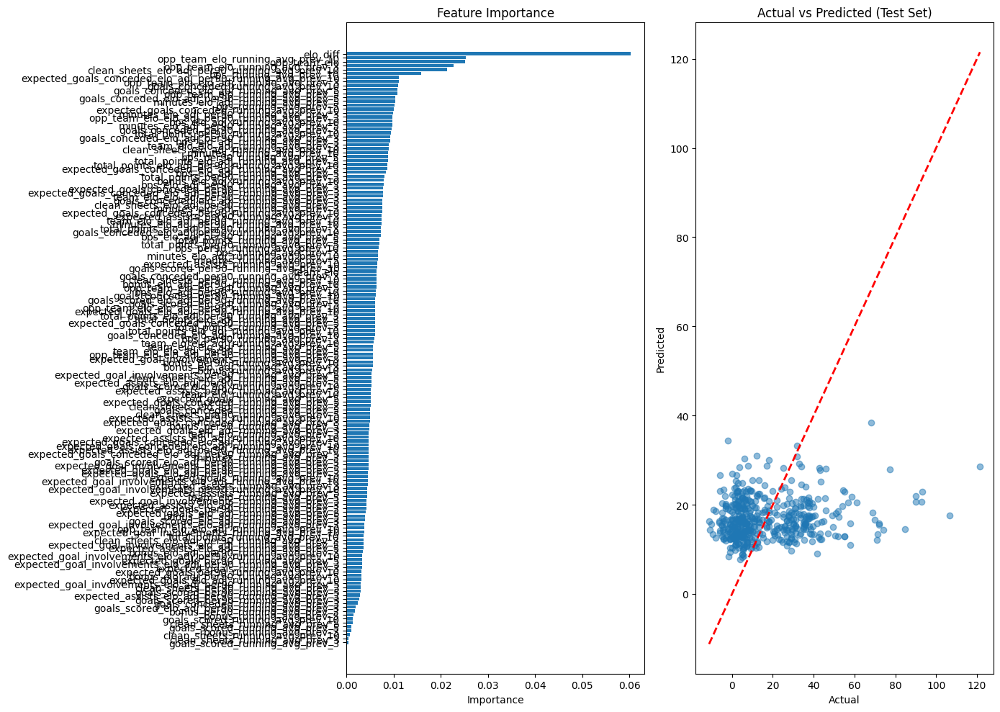

target=bps_per90, MID_bps_predictor
Cleaned df size: 10833/17135

Training Set Performance:
R² Score: 0.3921
RMSE: 9.1159
MAE: 7.0114

Test Set Performance:
R² Score: 0.0590
RMSE: 11.4115
MAE: 8.3236

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.113468
                             opp_team_elo_running_avg_prev_5    0.020800
                                                opp_team_elo    0.019734
                             opp_team_elo_running_avg_prev_3    0.019127
                        expected_assists_running_avg_prev_10    0.017656
                                     bps_running_avg_prev_10    0.017286
                               bps_per90_running_avg_prev_10    0.014517
                                bps_per90_running_avg_prev_3    0.013896
                            opp_team_elo_running_avg_prev_10    0.013455
                expected_assists_elo_adj_running_

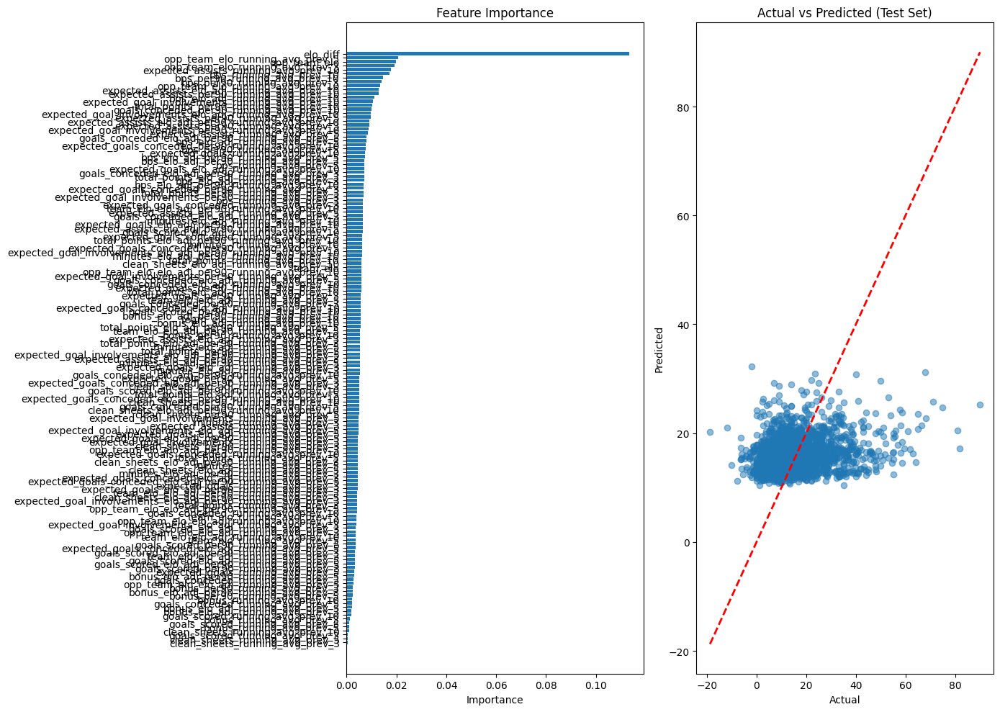

target=bps_per90, DEF_bps_predictor
Cleaned df size: 9321/15120

Training Set Performance:
R² Score: 0.4886
RMSE: 7.3057
MAE: 5.8472

Test Set Performance:
R² Score: 0.1478
RMSE: 9.3986
MAE: 7.4559

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.192259
                                                opp_team_elo    0.034702
                               bps_per90_running_avg_prev_10    0.024662
                             opp_team_elo_running_avg_prev_5    0.022671
                            opp_team_elo_running_avg_prev_10    0.021715
                             opp_team_elo_running_avg_prev_3    0.020486
                                team_elo_running_avg_prev_10    0.016291
                                bps_per90_running_avg_prev_5    0.015018
                                                    team_elo    0.014344
                       bps_elo_adj_per90_running_av

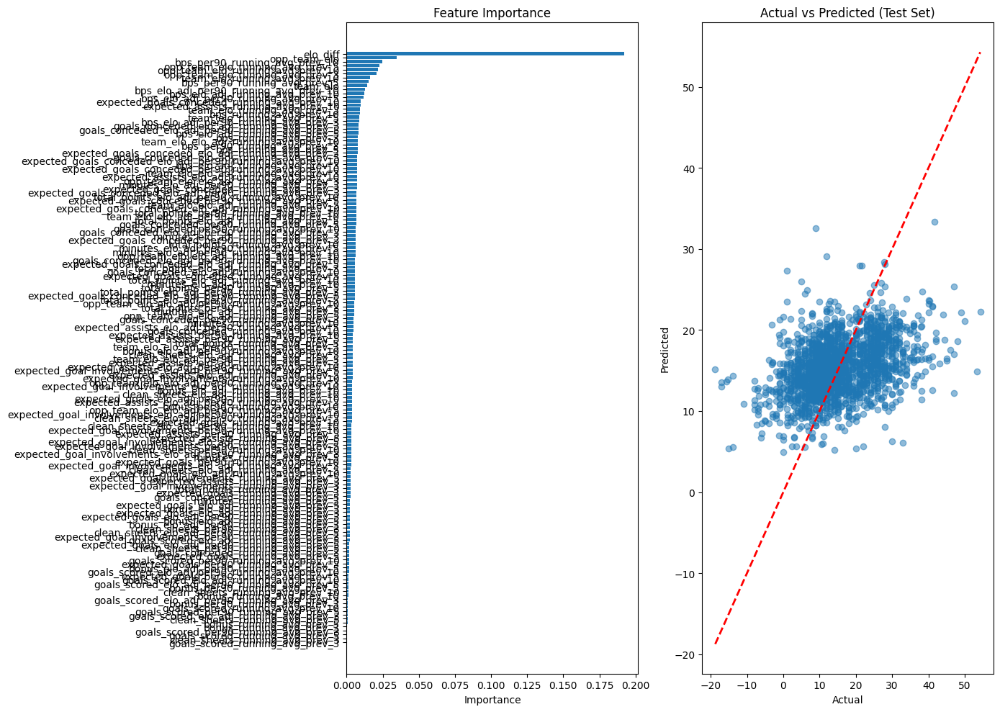

target=bps_per90, GK_bps_predictor
Cleaned df size: 2308/3690

Training Set Performance:
R² Score: 0.6569
RMSE: 5.4111
MAE: 4.4054

Test Set Performance:
R² Score: 0.0395
RMSE: 9.1487
MAE: 7.2978

Feature Importance:
                                                     feature   importance
                            opp_team_elo_running_avg_prev_10 4.236709e-02
                               bps_per90_running_avg_prev_10 3.359571e-02
                                                opp_team_elo 3.347700e-02
                             opp_team_elo_running_avg_prev_3 3.215302e-02
                             opp_team_elo_running_avg_prev_5 2.540338e-02
                                                    elo_diff 2.433508e-02
                                     bps_running_avg_prev_10 1.944453e-02
                        bps_elo_adj_per90_running_avg_prev_3 1.645424e-02
                                bps_per90_running_avg_prev_3 1.613449e-02
    expected_goals_conceded_elo_adj_per90_r

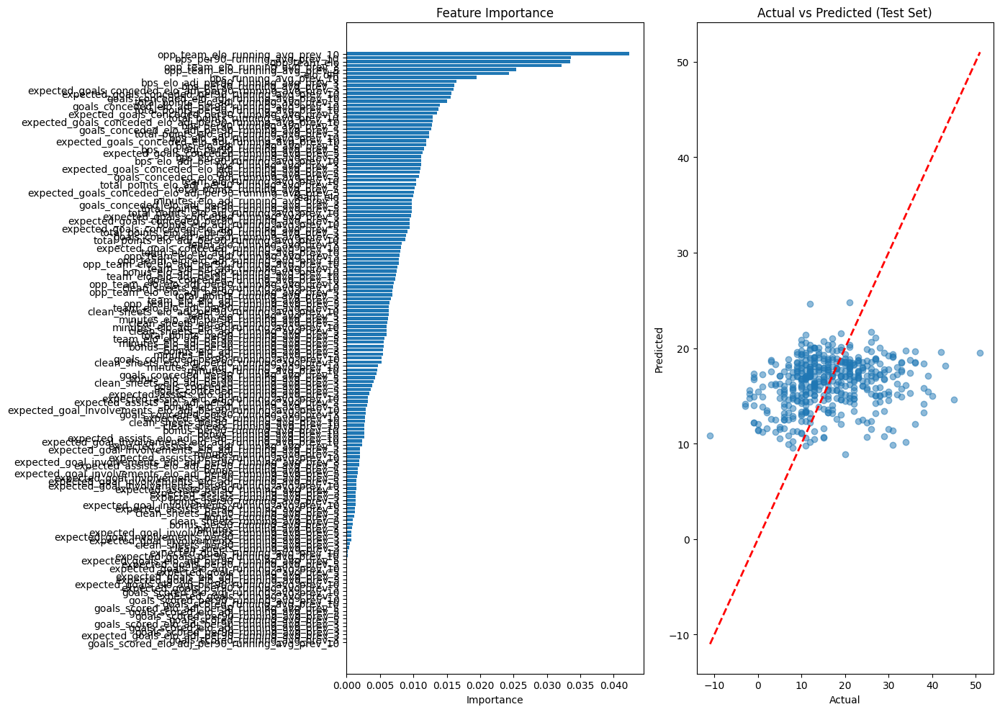

In [14]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=bps_per90, FWD_bps_predictor")
    FWD_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90', # try: 'bonus_per90'
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_bps_predictor.fit()
    FWD_bps_predictor.plot_results()

    print("target=bps_per90, MID_bps_predictor")
    MID_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_bps_predictor.fit()
    MID_bps_predictor.plot_results()
    
    print("target=bps_per90, DEF_bps_predictor")
    DEF_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_bps_predictor.fit()
    DEF_bps_predictor.plot_results()

    print("target=bps_per90, GK_bps_predictor")
    GK_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_bps_predictor.fit()
    GK_bps_predictor.plot_results()

target=saves_per90, GK_saves_predictor
Cleaned df size: 245/3847

Training Set Performance:
R² Score: 0.8637
RMSE: 0.5696
MAE: 0.4650

Test Set Performance:
R² Score: 0.0212
RMSE: 2.2230
MAE: 1.7101

Feature Importance:
                                                     feature  importance
                                                    team_elo    0.065897
                                                    elo_diff    0.058564
                                                opp_team_elo    0.033226
                            opp_team_elo_running_avg_prev_10    0.027346
                                recoveries_per90_alltime_avg    0.024353
                             opp_team_elo_running_avg_prev_5    0.023726
                                       cbi_per90_alltime_avg    0.022472
                                team_elo_running_avg_prev_10    0.021345
               opp_team_elo_elo_adj_per90_running_avg_prev_5    0.020315
                   team_elo_elo_adj_per90_running_

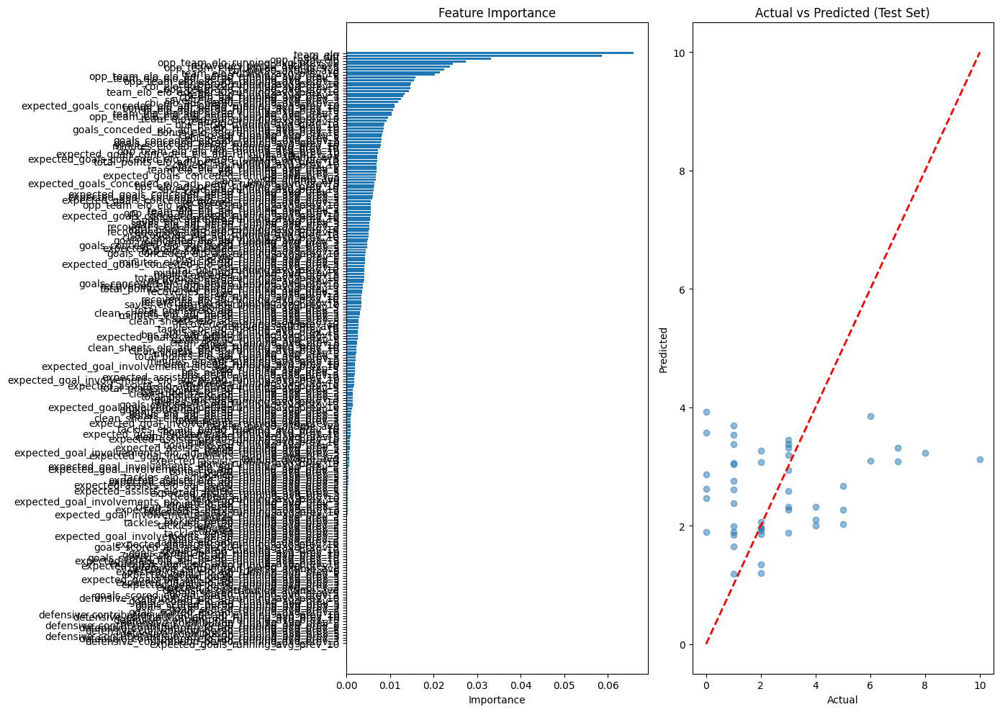

In [15]:
#shots saved
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>0)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=saves_per90, GK_saves_predictor")
    GK_saves_predictor = FPLPredictor(
    data=df[filtered],
    target='saves_per90',
    positions={'GK'})
    GK_saves_predictor.fit()
    GK_saves_predictor.plot_results()

target=defensive_contribution_per90, FWD_defcon_predictor
Cleaned df size: 270/4743

Training Set Performance:
R² Score: 0.8198
RMSE: 1.1680
MAE: 0.8746

Test Set Performance:
R² Score: -0.1267
RMSE: 3.0140
MAE: 2.2334

Feature Importance:
                                                     feature  importance
                                                    team_elo    0.024193
                                bps_per90_running_avg_prev_5    0.023024
                             opp_team_elo_running_avg_prev_5    0.022858
                   defensive_contribution_running_avg_prev_3    0.015825
                  expected_goals_conceded_running_avg_prev_3    0.015255
                            opp_team_elo_running_avg_prev_10    0.015130
                             opp_team_elo_running_avg_prev_3    0.013881
                       recoveries_elo_adj_running_avg_prev_3    0.013262
                   minutes_elo_adj_per90_running_avg_prev_10    0.013099
                    minutes_el

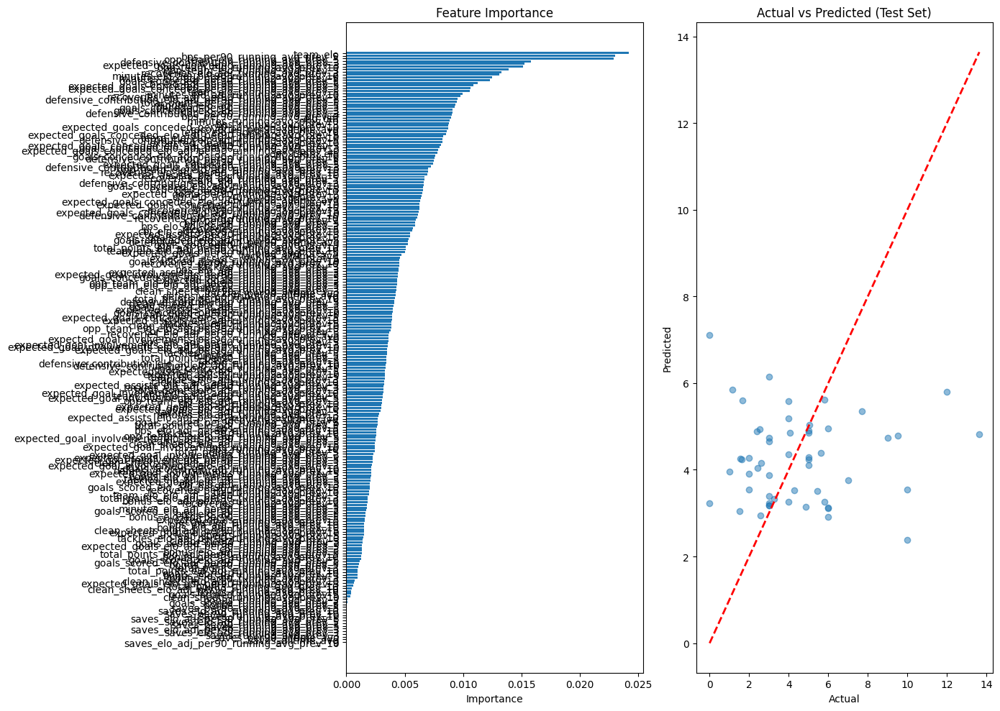

target=defensive_contribution_per90, MID_defcon_predictor
Cleaned df size: 1282/19545

Training Set Performance:
R² Score: 0.8059
RMSE: 1.7772
MAE: 1.4394

Test Set Performance:
R² Score: 0.1567
RMSE: 3.8349
MAE: 2.9776

Feature Importance:
                                                     feature  importance
                               cbi_per90_running_avg_prev_10    0.041739
        expected_goal_involvements_per90_running_avg_prev_10    0.025358
                         tackles_elo_adj_running_avg_prev_10    0.021301
                    expected_goals_per90_running_avg_prev_10    0.020712
                   tackles_elo_adj_per90_running_avg_prev_10    0.018456
            defensive_contribution_per90_running_avg_prev_10    0.016736
                                         tackles_alltime_avg    0.014514
                                                opp_team_elo    0.013816
                       cbi_elo_adj_per90_running_avg_prev_10    0.013587
               total_points_e

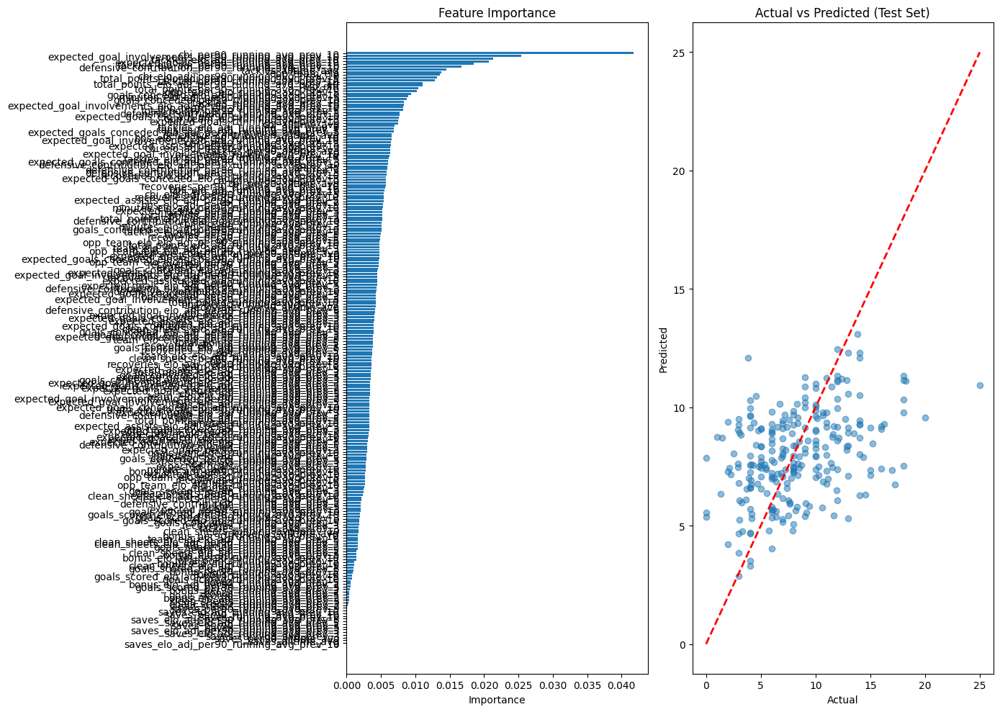

target=defensive_contribution_per90, DEF_defcon_predictor
Cleaned df size: 1053/16513

Training Set Performance:
R² Score: 0.7683
RMSE: 1.8294
MAE: 1.4501

Test Set Performance:
R² Score: 0.0437
RMSE: 3.7731
MAE: 2.9809

Feature Importance:
                                                     feature  importance
                                             cbi_alltime_avg    0.048827
          expected_assists_elo_adj_per90_running_avg_prev_10    0.032984
                                                opp_team_elo    0.020545
                                                    elo_diff    0.019666
                             opp_team_elo_running_avg_prev_3    0.018237
                             cbi_elo_adj_running_avg_prev_10    0.017372
               opp_team_elo_elo_adj_per90_running_avg_prev_5    0.017148
                            opp_team_elo_running_avg_prev_10    0.016302
                                     cbi_running_avg_prev_10    0.015769
                             

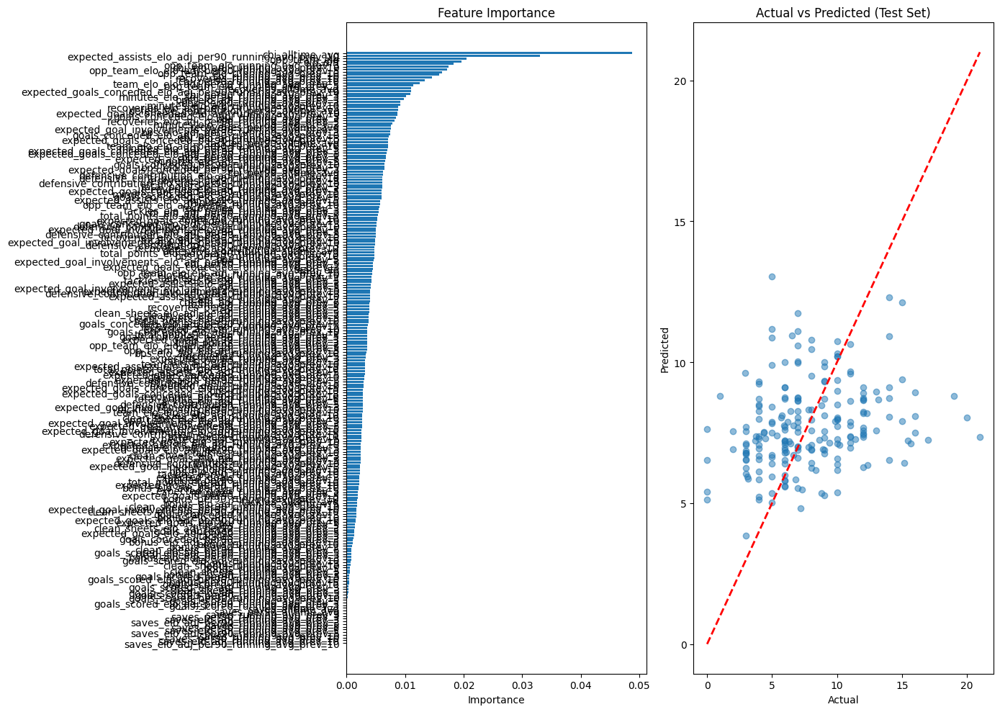

In [16]:
# >10 defcon (CBIT) for a defender
# >12 defcon (CBIT+R) for mid or fwd
filtered = (df['minutes']>30)&(df['player_season_minutes_total']>0)

if __name__ == "__main__":
    
    print("target=defensive_contribution_per90, FWD_defcon_predictor")
    FWD_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'FWD'})
    FWD_defcon_predictor.fit()
    FWD_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, MID_defcon_predictor")
    MID_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'MID'})
    MID_defcon_predictor.fit()
    MID_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, DEF_defcon_predictor")
    DEF_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'DEF'})
    DEF_defcon_predictor.fit()
    DEF_defcon_predictor.plot_results()

Goals conceded per 90
Estimated λ (mean goals per match): 1.341


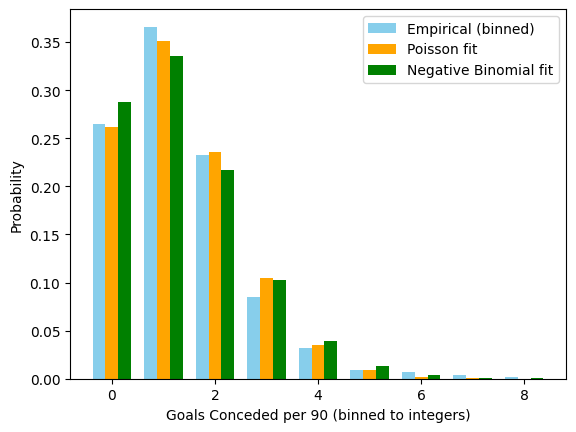

Mean: 1.334, Variance: 1.523
Overdispersion ratio (Var/Mean): 1.141
✅ Poisson assumption looks reasonable.
P(X < 1 goal) = 0.262


In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Goals conceded per 90")

# Compute xGC per 90
df['xgc_p90'] = (df['expected_goals_conceded'] / df['minutes']) * 90

# Filter to reasonable samples
data = df[(df['minutes'] > 0) & (df['xgc_p90'] < 8)]['xgc_p90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean goals per match): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Goals Conceded per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")

# --- Example probability ---
p_less_than_1 = poisson.cdf(0, mu=lambda_hat)
print(f"P(X < 1 goal) = {p_less_than_1:.3f}")


Mids & Forwards
Estimated λ (mean defcon per 90): 8.275


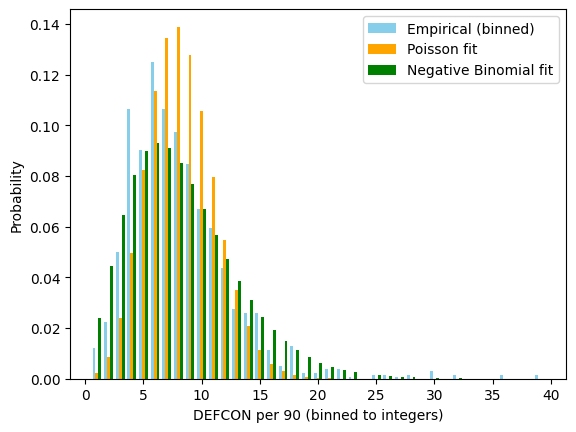

Mean: 8.269, Variance: 22.100
Overdispersion ratio (Var/Mean): 2.673
⚠️ Likely overdispersed → Negative Binomial may fit better.


In [18]:
#Test if defcon_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Mids & Forwards")

# Filter to reasonable samples
data = df[(df['minutes'] > 0)
          & (df['defensive_contribution_per90'] > 0) 
          & (df['defensive_contribution_per90'] < 40)
          & (df['position'].isin(['DEF']))]['defensive_contribution_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('DEFCON per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


GK saves per 90
Estimated λ (mean defcon per 90): 3.215


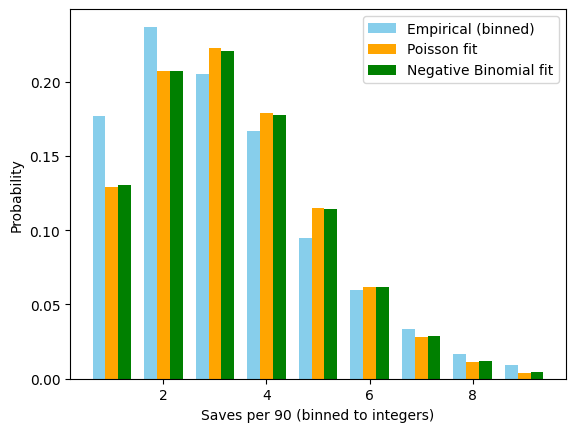

Mean: 3.215, Variance: 3.263
Overdispersion ratio (Var/Mean): 1.015
✅ Poisson assumption looks reasonable.


In [19]:
#Test if saves_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("GK saves per 90")

# Filter to reasonable samples
data = df[#(df['minutes'] > 0)
          (df['saves_per90'] > 0) 
          & (df['saves_per90'] < 10)
          & (df['position'].isin(['GK']))]['saves_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Saves per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


                                 OLS Regression Results                                
Dep. Variable:                  bonus   R-squared (uncentered):                   0.447
Model:                            OLS   Adj. R-squared (uncentered):              0.447
Method:                 Least Squares   F-statistic:                          3.219e+04
Date:                Wed, 03 Dec 2025   Prob (F-statistic):                        0.00
Time:                        13:22:20   Log-Likelihood:                         -37610.
No. Observations:               39897   AIC:                                  7.522e+04
Df Residuals:                   39896   BIC:                                  7.523e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

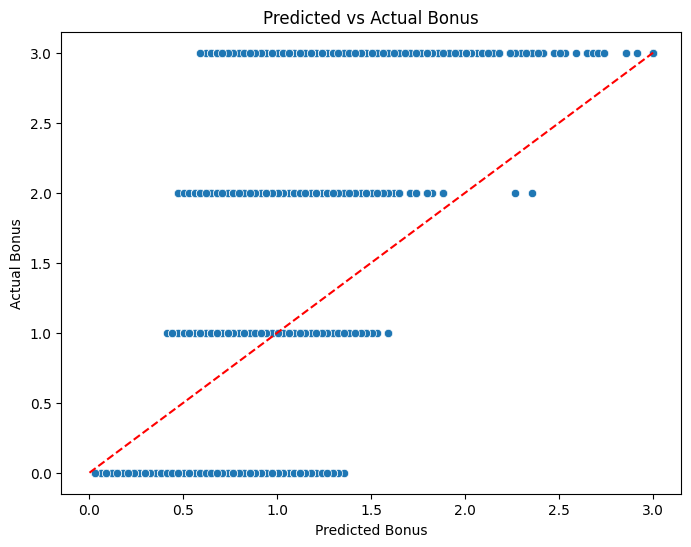

Actual Bonus       0.0       1.0       2.0       3.0
Position                                            
DEF           0.459231  0.232290  1.108386  1.951408
FWD           0.332599  0.199768  1.048448  1.711106
GK            0.491843  0.246648  1.116824  2.013845
GKP                NaN       NaN       NaN       NaN
MID           0.394331  0.246821  1.052318  1.827189


In [20]:
# Generalize the relationship between bps & bonus points
import statsmodels.formula.api as smf
filtered = (df['minutes']>45) & (df['bonus']>=0) & (df['bps']>0) & (df['position'].isin(['GK','DEF','MID','FWD']))
# df['bonus_sq'] = df['bonus']**2

model = smf.ols('bonus ~ bps -1', data=df[filtered]).fit()
print(model.summary())

df['bonus_pred'] = model.predict(df[filtered])
df['bonus_pred'] = np.clip(df['bonus_pred'], 0, 3) # clip prediction to 3

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(x='bonus_pred', y='bonus', data=df)
plt.plot([df['bonus'].min(), df['bonus'].max()],
         [df['bonus'].min(), df['bonus'].max()],
         color='red', linestyle='--')  # 45-degree line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs Actual Bonus')
plt.show()

import pandas as pd
import numpy as np

# Function to calculate RMSE
def rmse(actual, predicted):
    return np.sqrt(np.mean((actual - predicted) ** 2))

# Group by position and actual bonus, then calculate RMSE
rmse_table = df.groupby(['position', 'bonus']).apply(lambda x: rmse(x['bonus'], x['bonus_pred']))

# Convert to DataFrame
rmse_table = rmse_table.reset_index()
rmse_table.columns = ['Position', 'Actual Bonus', 'RMSE']

pivot_rmse = rmse_table.pivot(index='Position', columns='Actual Bonus', values='RMSE')
print(pivot_rmse)


In [21]:
prediction_data = df[(df['season']==20252026)
                     &(df['event']>=stats_current_gameweek+1)]

In [22]:
prediction_data.pivot_table(index='event',values='minutes',aggfunc='count')

,minutes
event,
15.0,0
16.0,0
17.0,0
18.0,0
19.0,0
20.0,0
21.0,0
22.0,0
23.0,0


In [23]:
def predict_target_vectorized(df, model_dict, col_name):
    preds = []
    
    for pos, model in model_dict.items():
        subset = df[df['position'] == pos]
        if not subset.empty:
            pos_preds = model.predict_new(subset)
            temp = subset.copy()
            temp[col_name] = pos_preds
            preds.append(temp)
    
    if not preds:
        # If no positions matched at all
        return pd.Series(index=df.index, dtype=float)
    
    result = pd.concat(preds)
    
    # Safely align back to original DataFrame
    output = pd.Series(index=df.index, dtype=float)
    output.loc[result.index] = result[col_name]
    return output

In [24]:
target_col_name = 'mins_pred'
mins_model_dict = {'FWD': FWD_mins_predictor, 'MID': MID_mins_predictor, 'DEF': DEF_mins_predictor, 'GK': GK_mins_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_20416\2521843321.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)


count    10920.000000
mean        34.803054
std         24.781856
min          1.217890
25%         11.142984
50%         31.934466
75%         57.981137
max         86.378000
Name: mins_pred, dtype: float64

In [25]:
target_col_name = 'xgp90_pred'
xg_model_dict = {'FWD': FWD_xG_predictor, 'MID': MID_xG_predictor, 'DEF': DEF_xG_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_20416\365369552.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)


count    10224.000000
mean         0.137862
std          0.121759
min          0.016280
25%          0.049317
50%          0.094026
75%          0.172866
max          0.840170
Name: xgp90_pred, dtype: float64

In [26]:
target_col_name = 'xap90_pred'
xA_model_dict = {'FWD': FWD_xA_predictor, 'MID': MID_xA_predictor, 'DEF': DEF_xA_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_20416\4144355699.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)


count    10224.000000
mean         0.079207
std          0.047027
min          0.009580
25%          0.043528
50%          0.068796
75%          0.104888
max          0.303031
Name: xap90_pred, dtype: float64

In [27]:
target_col_name = 'xgcp90_pred'
xGC_model_dict = {'FWD': FWD_xGC_predictor, 'MID': MID_xGC_predictor, 'DEF': DEF_xGC_predictor, 'GK':GK_xGC_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_20416\682035545.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)


count    10920.000000
mean         1.444127
std          0.388184
min          0.487783
25%          1.174922
50%          1.379991
75%          1.671476
max          2.899149
Name: xgcp90_pred, dtype: float64

In [28]:
target_col_name = 'xbpsp90_pred'
bps_model_dict = {'FWD': FWD_bps_predictor, 'MID': MID_bps_predictor, 'DEF': DEF_bps_predictor, 'GK':GK_bps_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_20416\3051138591.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)


count    10920.000000
mean        15.130626
std          3.215459
min          5.016729
25%         13.022172
50%         14.894364
75%         16.998108
max         29.571462
Name: xbpsp90_pred, dtype: float64

In [29]:
target_col_name = 'xsavesp90_pred'
saves_model_dict = {'GK':GK_saves_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_20416\803536942.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)


count    696.000000
mean       2.725801
std        0.546048
min        1.329367
25%        2.436982
50%        2.668944
75%        3.050445
max        4.244495
Name: xsavesp90_pred, dtype: float64

In [30]:
target_col_name = 'xdefconp90_pred'
defcon_model_dict = {'FWD': FWD_defcon_predictor, 'MID': MID_defcon_predictor, 'DEF': DEF_defcon_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_20416\2777375241.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)


count    10224.000000
mean         7.567619
std          1.912603
min          1.963442
25%          6.496838
50%          7.562263
75%          8.736167
max         15.791110
Name: xdefconp90_pred, dtype: float64

In [31]:
prediction_data[prediction_data['position']=='MID'].head()[["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]]

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
129860,Antoni Milambo,122.0,52.0,Brentford,MID,20252026.0,15.0,Spurs,1003.095679,3.170106,0.152060,0.038336,0.966929
129875,Adama Traoré Diarra,326.0,52.0,Fulham,MID,20252026.0,22.0,Leeds,915.108651,6.746365,0.219209,0.146400,1.066818
129877,Adam Wharton,273.0,50.0,Crystal Palace,MID,20252026.0,15.0,Fulham,1031.213353,58.532237,0.080899,0.183519,1.170342
129879,Adam Wharton,273.0,50.0,Crystal Palace,MID,20252026.0,16.0,Man City,1224.133557,59.420898,0.070792,0.143555,1.704237
129880,Adam Wharton,273.0,50.0,Crystal Palace,MID,20252026.0,17.0,Leeds,915.108651,58.237580,0.106217,0.228561,1.063773


In [32]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>0)
    ][["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]].sort_values(by='xgp90_pred',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
134308,Erling Haaland,430.0,149.0,Man City,FWD,20252026.0,15.0,Sunderland,1041.902328,77.766538,0.709606,0.101298,1.267529
132121,Charalampos Kostoulas,181.0,48.0,Brighton,FWD,20252026.0,15.0,West Ham,976.162043,2.871067,0.669386,0.083118,1.286678
135806,Hugo Ekitiké,661.0,85.0,Liverpool,FWD,20252026.0,15.0,Leeds,915.108651,30.301215,0.596356,0.062182,0.826102
133055,Danny Welbeck,178.0,66.0,Brighton,FWD,20252026.0,15.0,West Ham,976.162043,59.275844,0.555506,0.051234,0.972431
130136,Alexander Isak,499.0,104.0,Liverpool,FWD,20252026.0,15.0,Leeds,915.108651,34.324252,0.554846,0.066061,0.823505
146436,William Osula,500.0,54.0,Newcastle,FWD,20252026.0,15.0,Burnley,890.090321,5.239529,0.532638,0.092081,1.198488
145160,Stefanos Tzimas,180.0,53.0,Brighton,FWD,20252026.0,15.0,West Ham,976.162043,17.632430,0.526298,0.080862,1.149316
137325,Jean-Philippe Mateta,283.0,81.0,Crystal Palace,FWD,20252026.0,15.0,Fulham,1031.213353,56.315362,0.523709,0.066101,1.072376
131964,Callum Wilson,671.0,58.0,West Ham,FWD,20252026.0,15.0,Brighton,1109.562665,49.693644,0.514613,0.035747,1.597773
138390,João Pedro Junqueira de Jesus,249.0,74.0,Chelsea,FWD,20252026.0,15.0,Bournemouth,1044.803103,44.078124,0.504208,0.100419,1.284682


In [33]:
import pandas as pd
from scipy.stats import nbinom

def calculate_negbinom_parameters(position_list, df):

    # 1. Calculate mean and variance
    filtered = (df['minutes'] > 0) & (df['defensive_contribution_per90'] > 0) & (df['defensive_contribution_per90'] < 40) & (df['position'].isin(position_list))
    mean = df[filtered]['defensive_contribution_per90'].mean()
    variance = df[filtered]['defensive_contribution_per90'].var()
    # r = number of successes
    r = (mean**2) / (variance - mean)
    # p = success probability
    p = r / (r + mean)
    return r,p

In [34]:
from scipy.stats import poisson
import numpy as np

def expected_score(mu, max_events=10, rule=None, points_per_n=None, points_value=None):
    """
    Calculate the expected score given an average event rate (mu)
    using a Poisson model.

    Parameters
    ----------
    mu : float
        Expected number of events (e.g., goals conceded, shots saved).
    max_events : int
        Maximum number of discrete events to sum over.
    rule : callable, optional
        Function that maps event count -> points. Example: lambda k: -np.floor(k / 2)
    points_per_n : int, optional
        For simple rules: number of events required for one point (e.g. 3 shots saved = 1 pt)
    points_value : float, optional
        Value of that one point (e.g. +1 for shots saved, -1 for goals conceded)

    Returns
    -------
    float
        Expected points based on Poisson-distributed event counts.
    """
    array = np.arange(0, max_events + 1)
    probs = poisson.pmf(array, mu)

    if rule is not None:
        scores = np.array([rule(k) for k in array])
    elif points_per_n is not None and points_value is not None:
        # General simple rule: 1 point_value for every n events
        scores = np.floor(array / points_per_n) * points_value
    else:
        raise ValueError("You must provide either a rule function or both points_per_n and points_value.")

    return np.sum(scores * probs)


In [35]:
scoring_dict = {
    "FWD": {'xgp90_pred': 4, 'xap90_pred': 3, 'xgcp90_pred': 0, 'xgc_ss':0, 'defcon':2},
    "MID": {'xgp90_pred': 5, 'xap90_pred': 3, 'xgcp90_pred': 1, 'xgc_ss':0, 'defcon':2},
    "DEF": {'xgp90_pred': 6, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2},
    "GK":  {'xgp90_pred': 10, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2}
}

def scoring(x, scoring_dict, points_type, negbinom_rp_dict=None):
    mins_factor = x['mins_pred']/90
    if points_type == 'mins':
        if pd.isna(x['mins_pred']):
            return 0
        elif x['mins_pred'] >= 60:
            return 2
        elif x['mins_pred'] > 0:
            return 1
        else:
            return 0
    if points_type == 'goals':
        goals_points = mins_factor * x['xgp90_pred'] * scoring_dict[x['position']]['xgp90_pred']
        return goals_points
    if points_type == 'assists':
        assist_points = mins_factor * x['xap90_pred'] * scoring_dict[x['position']]['xap90_pred']
        return assist_points
    if points_type == 'clean_sheets':
        p_less_than_1 = poisson.cdf(0, mu=x['xgcp90_pred'])
        cs_points = p_less_than_1 * scoring_dict[x['position']]['xgcp90_pred']
        return cs_points
    
    if points_type == 'shots_saved': 
        if x['position'] == 'GK':
            saves_points = expected_score(mu=x['xsavesp90_pred'],  # expected shots saved per 90
                                   max_events=15,
                                   points_per_n=3, #for every 3 shots saved
                                   points_value=1) #scores 1 point
            return saves_points
        else:
            return 0
        
    if points_type == 'goals_conceded':
        if x['position'] in ['DEF','GK']:
            gc_points = expected_score(mu=x['xgcp90_pred'], 
                                   max_events=10, 
                                   points_per_n=2, #for every 2 goals conceded 
                                   points_value=-1) #scores -1 points 
            return gc_points
        else:
            return 0

    if points_type == 'defcon':
        pos = x['position']
        if pos in ['MID','FWD']:
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 12
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        elif pos == 'DEF':
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 10
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        else: return 0

    if points_type == 'bonus':
        return x['xbpsp90_pred']*0.0294 # ols regression coefficient

prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
prediction_data['xpoints_assists'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='assists'), axis=1)
prediction_data['xpoints_clean_sheets'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='clean_sheets'), axis=1)

prediction_data['xpoints_shots_saved'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='shots_saved'), axis=1)
prediction_data['xpoints_goals_conceded'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals_conceded'), axis=1)

def_r,def_p = calculate_negbinom_parameters(['DEF'], df)
mid_r,mid_p = calculate_negbinom_parameters(['MID'], df)
fwd_r,fwd_p = calculate_negbinom_parameters(['FWD'], df)
rp_dict = {'DEF':{'r':def_r,'p':def_p},'MID':{'r':mid_r,'p':mid_p},'FWD':{'r':fwd_r,'p':fwd_p}}
prediction_data['xpoints_defcon'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='defcon', negbinom_rp_dict=rp_dict), axis=1)
prediction_data['xpoints_bonus'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='bonus'), axis=1)

prediction_data['xpoints'] = prediction_data[['xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets',
                                              'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus']].sum(axis=1, skipna=True)

C:\Users\chris\AppData\Local\Temp\ipykernel_20416\282654768.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_20416\282654768.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_

In [36]:
predictions = prediction_data[['player_name_id', 'team_name','team_elo','element','position','opp_team_name','opp_team_elo', 'season', 'value', 'event',
                       'mins_pred', 'xgp90_pred', 'xap90_pred', 'xgcp90_pred',
                       'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets','xpoints_shots_saved',
                       'xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                       'xpoints']]
predictions

,player_name_id,team_name,team_elo,element,position,opp_team_name,opp_team_elo,season,value,event,...,xgcp90_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
129683,Aaron Hickey,Brentford,1063.038520,116.0,DEF,Spurs,1003.095679,20252026.0,40.0,15.0,...,1.140292,1,0.148222,0.055570,1.278902,0.0,-0.345702,0.551766,0.445831,3.134590
129684,Aaron Hickey,Brentford,1063.038520,116.0,DEF,Leeds,915.108651,20252026.0,40.0,16.0,...,1.209273,1,0.155554,0.054143,1.193656,0.0,-0.376899,0.551766,0.592113,3.170334
129685,Aaron Hickey,Brentford,1063.038520,116.0,DEF,Wolves,917.944412,20252026.0,40.0,17.0,...,1.217824,1,0.155554,0.054143,1.183493,0.0,-0.380797,0.551766,0.580744,3.144903
129686,Aaron Hickey,Brentford,1063.038520,116.0,DEF,Bournemouth,1044.803103,20252026.0,40.0,18.0,...,1.187684,1,0.145162,0.051056,1.219706,0.0,-0.367087,0.551766,0.400149,3.000753
129687,Aaron Hickey,Brentford,1063.038520,116.0,DEF,Spurs,1003.095679,20252026.0,40.0,19.0,...,1.140292,1,0.148222,0.055570,1.278902,0.0,-0.345702,0.551766,0.445831,3.134590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146947,Álex Jiménez Sánchez,Bournemouth,1044.803103,713.0,DEF,Newcastle,1104.965416,20252026.0,45.0,33.0,...,1.531150,1,0.101720,0.051174,0.865147,0.0,-0.527267,0.551766,0.309795,2.352336
146948,Álex Jiménez Sánchez,Bournemouth,1044.803103,713.0,DEF,Leeds,915.108651,20252026.0,45.0,34.0,...,1.170309,1,0.115090,0.060895,1.241085,0.0,-0.359221,0.551766,0.502343,3.111957
146949,Álex Jiménez Sánchez,Bournemouth,1044.803103,713.0,DEF,Crystal Palace,1094.251425,20252026.0,45.0,35.0,...,1.532680,1,0.101854,0.051448,0.863825,0.0,-0.527996,0.551766,0.345307,2.386204
146950,Álex Jiménez Sánchez,Bournemouth,1044.803103,713.0,DEF,Man City,1224.133557,20252026.0,45.0,37.0,...,1.980873,1,0.101977,0.043948,0.551795,0.0,-0.745155,0.551766,0.300620,1.804951


In [37]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>60)
    #&(prediction_data['position'].isin(['MID','FWD']))
    ][["player_name_id","element","value","team_name","position","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xdefconp90_pred','xbpsp90_pred','xpoints'
    ]].sort_values(by='xpoints',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xdefconp90_pred,xbpsp90_pred,xpoints
143592,Phil Foden,414.0,81.0,Man City,MID,15.0,Sunderland,1041.902328,78.662209,0.384604,0.202598,9.483075,24.571605,5.773245
134308,Erling Haaland,430.0,149.0,Man City,FWD,15.0,Sunderland,1041.902328,77.766538,0.709606,0.101298,4.070988,25.945957,5.723294
132462,Cody Gakpo,384.0,75.0,Liverpool,MID,15.0,Leeds,915.108651,63.814348,0.393197,0.245729,4.312506,22.659973,5.665684
146212,Virgil van Dijk,373.0,60.0,Liverpool,DEF,15.0,Leeds,915.108651,63.168578,0.063370,0.046930,7.947446,22.522712,5.374655
131876,Bukayo Saka,16.0,101.0,Arsenal,MID,15.0,Aston Villa,1146.622491,64.456094,0.320906,0.225284,8.044510,20.900132,5.096380
131757,Bruno Borges Fernandes,449.0,89.0,Man Utd,MID,15.0,Wolves,917.944412,68.506610,0.308966,0.219810,7.983489,19.619377,5.092714
139727,Lewis Hall,473.0,52.0,Newcastle,DEF,15.0,Burnley,890.090321,63.865308,0.070415,0.099327,6.623712,23.077812,5.073665
135666,Harvey Barnes,487.0,64.0,Newcastle,MID,15.0,Burnley,890.090321,61.048519,0.358548,0.163935,5.714421,19.825196,5.006109
140297,Malick Thiaw,684.0,49.0,Newcastle,DEF,15.0,Burnley,890.090321,77.121534,0.063165,0.061337,7.144995,21.447088,4.931709
132772,Dan Burn,476.0,51.0,Newcastle,DEF,15.0,Burnley,890.090321,63.163075,0.046273,0.043563,8.437949,20.534621,4.868529


In [38]:
table_name = "predictions"
if __name__ == "__main__":
    db_creator.create_staging_table_then_insert_data(table_name, data=predictions)
    preds = db_creator.table_to_df(table_name=table_name)
    print(preds.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10920 entries, 0 to 10919
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   player_name_id          10920 non-null  object 
 1   team_name               10920 non-null  object 
 2   team_elo                10920 non-null  float64
 3   element                 10920 non-null  float64
 4   position                10920 non-null  object 
 5   opp_team_name           10920 non-null  object 
 6   opp_team_elo            10920 non-null  float64
 7   season                  10920 non-null  float64
 8   value                   10920 non-null  float64
 9   event                   10920 non-null  float64
 10  mins_pred               10920 non-null  float64
 11  xgp90_pred              10224 non-null  float64
 12  xap90_pred              10224 non-null  float64
 13  xgcp90_pred             10920 non-null  float64
 14  xpoints_mins            10920 non-null

In [39]:
# Add new columns to the xPoints table
db_creator.execute_sql("""
    ALTER TABLE predictions
    ADD COLUMN IF NOT EXISTS in_any_team INTEGER DEFAULT 0,
    ADD COLUMN IF NOT EXISTS in_my_team INTEGER DEFAULT 0
""")

In [40]:
current_gameweek = picks_current_gameweek
my_name = "Christopher Harris"

# Get the player lists
view = db_creator.run_sql(f"""
    WITH 
    current_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
    ),
    my_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
    SELECT * FROM my_players
""")

# Update the flags
db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_any_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
    )
""")

db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_my_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
""")

In [41]:
print(f"Gameweek {picks_current_gameweek+1} Predictions")
prediction_data[
    prediction_data['event']==picks_current_gameweek+1
][["player_name_id","element",'event',"value","team_name","position","opp_team_name","opp_team_elo"
   ,'mins_pred', 'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets', 
   'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
   'xpoints'
   ]].sort_values(by='xpoints',ascending=False
    ).head(10)

Gameweek 15 Predictions


,player_name_id,element,event,value,team_name,position,opp_team_name,opp_team_elo,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
143592,Phil Foden,414.0,15.0,81.0,Man City,MID,Sunderland,1041.902328,78.662209,2,1.680768,0.531228,0.346163,0.0,0.000000,0.492682,0.722405,5.773245
134308,Erling Haaland,430.0,15.0,149.0,Man City,FWD,Sunderland,1041.902328,77.766538,2,2.452603,0.262586,0.000000,0.0,0.000000,0.245294,0.762811,5.723294
132462,Cody Gakpo,384.0,15.0,75.0,Liverpool,MID,Leeds,915.108651,63.814348,2,1.393979,0.522702,0.590118,0.0,0.000000,0.492682,0.666203,5.665684
146212,Virgil van Dijk,373.0,15.0,60.0,Liverpool,DEF,Leeds,915.108651,63.168578,2,0.266866,0.098817,1.961457,0.0,-0.166418,0.551766,0.662168,5.374655
131876,Bukayo Saka,16.0,15.0,101.0,Arsenal,MID,Aston Villa,1146.622491,64.456094,2,1.149130,0.484030,0.356074,0.0,0.000000,0.492682,0.614464,5.096380
131757,Bruno Borges Fernandes,449.0,15.0,89.0,Man Utd,MID,Wolves,917.944412,68.506610,2,1.175902,0.501949,0.345371,0.0,0.000000,0.492682,0.576810,5.092714
139727,Lewis Hall,473.0,15.0,52.0,Newcastle,DEF,Burnley,890.090321,63.865308,2,0.299806,0.211451,1.584418,0.0,-0.252263,0.551766,0.678488,5.073665
135666,Harvey Barnes,487.0,15.0,64.0,Newcastle,MID,Burnley,890.090321,61.048519,2,1.216047,0.333600,0.380919,0.0,0.000000,0.492682,0.582861,5.006109
140297,Malick Thiaw,684.0,15.0,49.0,Newcastle,DEF,Burnley,890.090321,77.121534,2,0.324760,0.157679,1.533167,0.0,-0.266207,0.551766,0.630544,4.931709
132772,Dan Burn,476.0,15.0,51.0,Newcastle,DEF,Burnley,890.090321,63.163075,2,0.194851,0.091719,1.659415,0.0,-0.232941,0.551766,0.603718,4.868529


In [42]:
current_gameweek=picks_current_gameweek
print(f"Next 5 GWs: GW{current_gameweek+1} - GW{current_gameweek+5}")
next_5_gws_filter = (prediction_data['event']>=current_gameweek)&(prediction_data['event']<=current_gameweek+5)
prediction_data[next_5_gws_filter].groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Next 5 GWs: GW15 - GW19


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
364,Phil Foden,393.182614,10,8.360477,2.868232,1.789096,0.0,0.000000,2.463409,3.618845,29.100059
120,Erling Haaland,391.310412,10,12.218830,1.336249,0.000000,0.0,0.000000,1.226471,3.689410,28.470960
73,Cody Gakpo,321.702599,10,6.908009,2.552724,2.428699,0.0,0.000000,2.463409,3.139953,27.492794
57,Bukayo Saka,319.897930,10,6.147666,2.481581,2.034853,0.0,0.000000,2.463409,3.371071,26.498579
393,Rúben dos Santos Gato Alves Dias,399.482770,10,4.085301,0.705562,6.419232,0.0,-1.766729,2.758831,2.541838,24.744035
435,Virgil van Dijk,318.384480,10,1.226842,0.469455,8.509275,0.0,-1.184015,2.758831,2.939009,24.719397
336,Nico O'Reilly,344.352624,10,2.607925,1.845250,6.130451,0.0,-1.859882,2.758831,2.490877,23.973452
54,Bruno Borges Fernandes,342.591537,10,5.088837,2.133156,1.443081,0.0,0.000000,2.463409,2.744988,23.873472
238,Jérémy Doku,304.591368,10,4.431455,1.985836,1.905368,0.0,0.000000,2.463409,2.957596,23.743664
156,Harvey Barnes,305.129934,10,5.424236,1.634076,1.512337,0.0,0.000000,2.463409,2.675261,23.709320


In [43]:
print("Rest of Season Predictions")
prediction_data.groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 
                                           'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Rest of Season Predictions


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
364,Phil Foden,1887.250863,48,39.316642,13.732927,7.895863,0.0,0.000000,11.824366,17.077210,137.847007
120,Erling Haaland,1874.981802,48,53.430909,6.430068,0.000000,0.0,0.000000,5.887061,16.298167,130.046206
57,Bukayo Saka,1529.705895,48,30.367506,12.002582,10.090694,0.0,0.000000,11.824366,16.589363,128.874510
73,Cody Gakpo,1547.021904,48,32.655267,11.585347,8.431529,0.0,0.000000,11.824366,13.866023,126.362532
393,Rúben dos Santos Gato Alves Dias,1917.995959,48,19.564940,3.379980,31.261176,0.0,-8.581209,13.242387,12.440667,119.307940
336,Nico O'Reilly,1655.768517,48,12.666698,8.824736,29.154261,0.0,-9.179067,13.242387,12.387421,115.096436
93,Declan Rice,1599.280361,48,18.123474,11.441590,10.046049,0.0,0.000000,11.824366,15.575735,115.011215
118,Enzo Fernández,1568.982755,48,22.482150,12.622522,7.318534,0.0,0.000000,11.824366,12.755784,115.003356
362,Pedro Lomba Neto,1587.397337,48,26.212774,8.781148,7.483777,0.0,0.000000,11.824366,11.935508,114.237572
54,Bruno Borges Fernandes,1647.176123,48,23.326822,9.860570,6.534125,0.0,0.000000,11.824366,13.010539,112.556422


In [44]:
from datetime import datetime

# Add the columns
db_creator.execute_sql("""
    ALTER TABLE predictions
    ADD COLUMN IF NOT EXISTS prediction_timestamp TIMESTAMP,
    ADD COLUMN IF NOT EXISTS prediction_gameweek INTEGER;
""")

# Update ALL existing rows with current timestamp and gameweek
db_creator.execute_sql("""
    UPDATE predictions
    SET prediction_timestamp = :timestamp,
        prediction_gameweek = :gameweek;
""", params={
    'timestamp': datetime.now(),
    'gameweek': picks_current_gameweek
})

In [45]:
# # Reset predictions table

# db_creator.execute_sql("""
#     DROP TABLE IF EXISTS predictions_allgws
# """)

In [111]:
# Step 1: Insert new predictions that don't exist yet
db_creator.execute_sql("""
INSERT INTO predictions_allgws
SELECT p.*, 
            -- pg.player_name_id, pg.team_name, pg.team_elo, pg.element, pg.position, pg.opp_team_name, pg.opp_team_elo, pg.value,
            pg.fixture, pg.total_points, pg.minutes, pg.goals_scored, pg.assists, pg.bonus, 
            pg.bps, pg.clean_sheets, pg.goals_conceded, pg.was_home, pg.expected_assists, 
            pg.expected_goal_involvements, pg.expected_goals, pg.expected_goals_conceded, 
            pg.starts, pg.cbi, pg.defensive_contribution, pg.recoveries, pg.tackles, pg.saves 
FROM predictions p
LEFT JOIN playergw pg 
    ON p.player_name_id = pg.player_name_id 
    AND p.event = pg.event 
    AND p.season = pg.season
WHERE NOT EXISTS (
    SELECT 1 
    FROM predictions_allgws pa 
    WHERE pa.player_name_id = p.player_name_id 
        AND pa.event = p.event 
        AND pa.season = p.season
);
""")

# Step 2: Update existing predictions with actual results (where total_points is still NULL)
db_creator.execute_sql("""
UPDATE predictions_allgws
SET 
    fixture = pg.fixture,
    total_points = pg.total_points,
    minutes = pg.minutes,
    goals_scored = pg.goals_scored,
    assists = pg.assists,
    bonus = pg.bonus,
    bps = pg.bps,
    clean_sheets = pg.clean_sheets,
    goals_conceded = pg.goals_conceded,
    expected_assists = pg.expected_assists,
    expected_goal_involvements = pg.expected_goal_involvements,
    expected_goals = pg.expected_goals,
    expected_goals_conceded = pg.expected_goals_conceded,
    starts = pg.starts,
    cbi = pg.cbi,
    defensive_contribution = pg.defensive_contribution,
    recoveries = pg.recoveries,
    tackles = pg.tackles,
    saves = pg.saves
FROM playergw pg
WHERE predictions_allgws.player_name_id = pg.player_name_id
    AND predictions_allgws.event = pg.event
    AND predictions_allgws.season = pg.season
    AND predictions_allgws.total_points IS NULL;  -- Only update rows without actual points yet
""")

print(f"Successfully added/updated gameweek {picks_current_gameweek} predictions in predictions_allgws")

Successfully added/updated gameweek 14 predictions in predictions_allgws


In [112]:
# # # Create predictions_allgws if it doesn't exist, otherwise append
# # # creates new rows every time the script is loaded
# # db_creator.execute_sql("""
# #     CREATE TABLE IF NOT EXISTS predictions_allgws AS
# #     SELECT * FROM predictions WHERE 1=0;  -- Creates empty table with same schema, 1=0 ensures no data copied, just structure
    
# #     INSERT INTO predictions_allgws
# #     SELECT * FROM predictions;
# # """)

# # Create predictions_allgws if it doesn't exist
# db_creator.execute_sql("""
#     CREATE TABLE IF NOT EXISTS predictions_allgws AS
#     SELECT p.*,
#             -- pg.player_name_id, pg.team_name, pg.team_elo, pg.element, pg.position, pg.opp_team_name, pg.opp_team_elo, pg.value,
#             pg.fixture, pg.total_points, pg.minutes, pg.goals_scored, pg.assists, pg.bonus, 
#             pg.bps, pg.clean_sheets, pg.goals_conceded, pg.was_home, pg.expected_assists, 
#             pg.expected_goal_involvements, pg.expected_goals, pg.expected_goals_conceded, 
#             pg.starts, pg.cbi, pg.defensive_contribution, pg.recoveries, pg.tackles, pg.saves 
            
#     FROM predictions p
#     LEFT JOIN playergw pg 
#         ON p.player_name_id = pg.player_name_id 
#         AND p.event = pg.event
#         AND p.season = pg.season
#     WHERE 1=0;  -- Empty table with correct schema
# """)

# # Insert new predictions from current gameweek
# db_creator.execute_sql("""
#     INSERT INTO predictions_allgws
#     SELECT p.*, 
#             -- pg.player_name_id, pg.team_name, pg.team_elo, pg.element, pg.position, pg.opp_team_name, pg.opp_team_elo, pg.value,
#             pg.fixture, pg.total_points, pg.minutes, pg.goals_scored, pg.assists, pg.bonus, 
#             pg.bps, pg.clean_sheets, pg.goals_conceded, pg.was_home, pg.expected_assists, 
#             pg.expected_goal_involvements, pg.expected_goals, pg.expected_goals_conceded, 
#             pg.starts, pg.cbi, pg.defensive_contribution, pg.recoveries, pg.tackles, pg.saves
                       
#     FROM predictions p
#     LEFT JOIN playergw pg 
#         ON p.player_name_id = pg.player_name_id 
#         AND p.event = pg.event
#         AND p.season = pg.season;
# """)

# print(f"Successfully added gameweek {picks_current_gameweek} predictions to predictions_allgws")

In [113]:
df = db_creator.table_to_df('playergw')
future_filter = (df['season']==20252026)&(df['event']>=13)&(df['player_name_id']=='Erling Haaland')
df[['player_name_id','event','season','total_points','minutes']][future_filter].head()

,player_name_id,event,season,total_points,minutes
177388,Erling Haaland,13.0,20252026.0,2.0,90.0
177389,Erling Haaland,14.0,20252026.0,14.0,90.0
190246,Erling Haaland,15.0,20252026.0,NaN,NaN
190281,Erling Haaland,16.0,20252026.0,NaN,NaN
190316,Erling Haaland,17.0,20252026.0,NaN,NaN


In [123]:
df = db_creator.table_to_df('predictions')
future_filter = (df['season']==20252026)&(df['event']<=16)&(df['player_name_id']=='Erling Haaland')
df[['player_name_id','event','season','xpoints']][future_filter]

,player_name_id,event,season,xpoints
9244,Erling Haaland,15.0,20252026.0,5.723294
9245,Erling Haaland,16.0,20252026.0,5.517031


In [129]:
df = db_creator.table_to_df('predictions_allgws')
df[['player_name_id','prediction_timestamp','event','xpoints','total_points','minutes']][
    (df['season']==20252026)&(
    df['event']<=17)&(df['player_name_id']=='Erling Haaland')]

,player_name_id,prediction_timestamp,event,xpoints,total_points,minutes
12004,Erling Haaland,2025-12-02 12:42:34.616921,14.0,5.792425,14.0,90.0
12005,Erling Haaland,2025-12-02 12:21:57.509787,14.0,5.792425,14.0,90.0
12006,Erling Haaland,2025-12-02 12:42:34.616921,15.0,5.546765,NaN,NaN
12007,Erling Haaland,2025-12-02 12:21:57.509787,15.0,5.546765,NaN,NaN
12008,Erling Haaland,2025-12-03 13:22:30.909046,15.0,5.723294,NaN,NaN
12009,Erling Haaland,2025-12-03 13:22:30.909046,15.0,5.723294,NaN,NaN
12010,Erling Haaland,2025-12-02 12:42:34.616921,16.0,5.380279,NaN,NaN
12011,Erling Haaland,2025-12-02 12:21:57.509787,16.0,5.380279,NaN,NaN
12012,Erling Haaland,2025-12-03 13:22:30.909046,16.0,5.517031,NaN,NaN
12013,Erling Haaland,2025-12-03 13:22:30.909046,16.0,5.517031,NaN,NaN


In [130]:
# Get the data from the predictions table
df = db_creator.table_to_df('predictions_allgws')

# Remove rows where actual_points is missing
gw_filter=(df['prediction_gameweek']>=13)&(
            df['event']>=13)&(
                df['event']<=15)&(
            df['season']==20252026)&(
            df['player_name_id']=='Erling Haaland')
df_complete = df[gw_filter]

df_complete.pivot_table(index=['prediction_timestamp','prediction_gameweek','season','event'], values=['xpoints','total_points'])

total_points  \
prediction_timestamp       prediction_gameweek season     event                 
2025-12-02 12:21:57.509787 13                  20252026.0 14.0           14.0   
                                                          15.0            NaN   
2025-12-02 12:42:34.616921 13                  20252026.0 14.0           14.0   
                                                          15.0            NaN   
2025-12-03 13:22:30.909046 14                  20252026.0 15.0            NaN   

                                                                  xpoints  
prediction_timestamp       prediction_gameweek season     event            
2025-12-02 12:21:57.509787 13                  20252026.0 14.0   5.792425  
                                                          15.0   5.546765  
2025-12-02 12:42:34.616921 13                  20252026.0 14.0   5.792425  
                                                          15.0   5.546765  
2025-12-03 13:22:30.909046 14                  20252026.0 15.0   5.723294

In [136]:
# Get the data from the predictions table
df = db_creator.table_to_df('predictions_allgws')

# Remove rows where actual_points is missing
gw_filter=(df['event'] >= 13) & (df['minutes'] >= 1)
df_complete = df.dropna(subset=['total_points'])[gw_filter]

df_complete.pivot_table(index=['season','event'], values=['xpoints','total_points'], aggfunc='mean')

C:\Users\chris\AppData\Local\Temp\ipykernel_20416\686688159.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_complete = df.dropna(subset=['total_points'])[gw_filter]


,,total_points,xpoints
season,event,,
20252026.0,14.0,3.233333,3.302508


Correlation: 0.282
Mean Absolute Error: 2.434
Root Mean Squared Error: 3.375


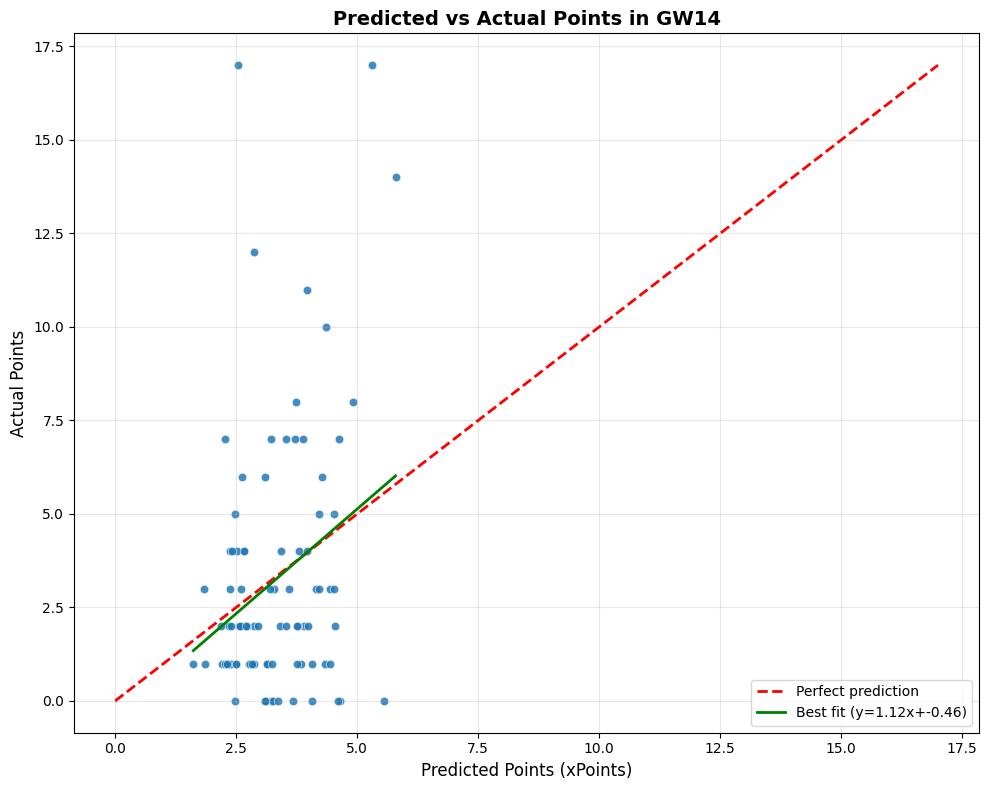

In [137]:
# Create the plot
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_complete, x='xpoints', y='total_points', alpha=0.6)

# Add a diagonal reference line (perfect predictions)
max_val = max(df_complete['xpoints'].max(), df_complete['total_points'].max())
plt.plot([0, max_val], [0, max_val], 'r--', label='Perfect prediction', linewidth=2)

# Add regression line showing actual correlation
from scipy.stats import linregress
slope, intercept, r_value, p_value, std_err = linregress(df_complete['xpoints'], df_complete['total_points'])
x_line = np.array([df_complete['xpoints'].min(), df_complete['xpoints'].max()])
y_line = slope * x_line + intercept
plt.plot(x_line, y_line, 'g-', label=f'Best fit (y={slope:.2f}x+{intercept:.2f})', linewidth=2)

print(f"Correlation: {df_complete['xpoints'].corr(df_complete['total_points']):.3f}")
print(f"Mean Absolute Error: {(df_complete['xpoints'] - df_complete['total_points']).abs().mean():.3f}")
print(f"Root Mean Squared Error: {((df_complete['xpoints'] - df_complete['total_points'])**2).mean()**0.5:.3f}")

plt.xlabel('Predicted Points (xPoints)', fontsize=12)
plt.ylabel('Actual Points', fontsize=12)
plt.title(f'Predicted vs Actual Points in GW{stats_current_gameweek}', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [138]:
finish=time.perf_counter()
print(f'Finished in {round(((finish-start)/60),2)} minute(s)')
#10/11/25: Finished in 8.91 minute(s)

Finished in 269.04 minute(s)
